# Deep Learning for Computer Vision:  Final Project

## Computer Science: COMS W 4995 006

#### Author: Carmem Domingues

### Problem: Distinguishing between underwater ocean images containing plastic and not

Plastic Pollution in our waterways (rivers, lakes, oceans, etc.) is a huge environmental problem in today's world. It is predicted that by 2050 there will be more plastic (by weight) than fish in the ocean. 

I would like to use Deep Learning and Computer Vision to help solve this problem. The applications of this are many, but we start with the simple problem of using DL and CV to distinguish between underwater ocean images that contain pieces of plastic, and those that do not (and only contain normal marine life). 

Data was collected manually via Google Searches. More information on the data collection process can be found on the Final Presentation and Final Report for this project.

For the analysis:

1. Start with a simple ConvNet, to help us distinguish between plastic and no-plastic images
2. Use a ConvNet (VGG16) that was pre-trained on ImageNet to see how we do
3. Modify the top layers for the binary case, freeze all layers up to the top, and retrain just the top ones 
4. Unfreeze all layers and continue fine tuning
5. Try ResNet, using similar process as steps 3-4
6. If time allows, we move on to object detection within the images, to try and identify which parts of the images are plastic vs. normal marine life

Note: Steps 1-4 are inspired and leverage code from homework 5.

In [1]:
import os
import h5py

import matplotlib.pyplot as plt
import time, pickle, pandas

import numpy as np

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, load_model
from keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, Conv2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.callbacks import TensorBoard, ModelCheckpoint
from keras import backend
from keras import optimizers

%matplotlib inline

/Users/carmem/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

Setup some basics for the models:

In [3]:
nb_classes = 2
class_name = {
    0: 'noplastic',
    1: 'plastic',
}

In [4]:
# dimensions of our images.
img_width, img_height = 150, 150

train_data_dir = '../Images/data_for_modeling/train'
validation_data_dir = '../Images/data_for_modeling/validation'
nb_train_samples = 900+700 # should be 893 + 699
nb_validation_samples = 77+70
batch_size = 32
steps_per_epoch_train = nb_train_samples / batch_size
steps_per_epoch_val = nb_validation_samples / batch_size

Use the code from homework 5 for showing the images:

In [5]:
def show_sample(X, y, prediction=-1):
    im = X
    plt.imshow(im)
    if prediction >= 0:
        plt.title("Class = %s, Predict = %s" % (class_name[y], class_name[prediction]))
    else:
        plt.title("Class = %s" % (class_name[y]))

    plt.axis('on')
    plt.show()

In [6]:
# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=32,
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_data_dir,
        target_size=(img_width, img_height),
        batch_size=32,
        class_mode='binary')

Found 1586 images belonging to 2 classes.
Found 147 images belonging to 2 classes.


In [7]:
nb_train_samples, nb_validation_samples

(1600, 147)

In [8]:
type(train_generator)

keras.preprocessing.image.DirectoryIterator

In [33]:
len(train_generator), len(validation_generator)

(50, 5)

In [11]:
len(train_generator[0])

2

In [20]:
type(train_generator[0])

tuple

In [13]:
train_generator[0]

(array([[[[2.35294141e-02, 5.60784340e-01, 9.68627512e-01],
          [2.35294141e-02, 5.60784340e-01, 9.68627512e-01],
          [2.35294141e-02, 5.60784340e-01, 9.68627512e-01],
          ...,
          [3.92156886e-03, 3.17647070e-01, 9.96078491e-01],
          [3.92156886e-03, 3.17647070e-01, 9.96078491e-01],
          [3.92156886e-03, 3.17647070e-01, 9.96078491e-01]],
 
         [[2.35294141e-02, 5.60784340e-01, 9.68627512e-01],
          [2.35294141e-02, 5.60784340e-01, 9.68627512e-01],
          [2.35294141e-02, 5.60784340e-01, 9.68627512e-01],
          ...,
          [3.92156886e-03, 3.17647070e-01, 9.96078491e-01],
          [3.92156886e-03, 3.17647070e-01, 9.96078491e-01],
          [3.92156886e-03, 3.17647070e-01, 9.96078491e-01]],
 
         [[2.35294141e-02, 5.60784340e-01, 9.68627512e-01],
          [2.35294141e-02, 5.60784340e-01, 9.68627512e-01],
          [2.35294141e-02, 5.60784340e-01, 9.68627512e-01],
          ...,
          [3.92156886e-03, 3.17647070e-01, 9.9607

In [18]:
train_generator[0][0][0][0][1]

array([8.8947453e-04, 2.9500714e-01, 9.9652320e-01], dtype=float32)

In [21]:
tup1 = ('physics', 'chemistry', 1997, 2000)
tup2 = (1, 2, 3, 4, 5, 6, 7 )

print ("tup1[0]: ", tup1[0])

tup1[0]:  physics


In [22]:
tup1[0][0]

'p'

In [23]:
len(train_generator[0][0])

32

In [24]:
type(train_generator[0][0])

numpy.ndarray

In [26]:
# these are the xs (images, batchsizes... (batchsize, * taget shape(img_size, img_size), channels))train_generator[0][0]

array([[[[4.18621348e-03, 3.17911714e-01, 9.96343136e-01],
         [7.32104946e-03, 3.21046561e-01, 9.99477983e-01],
         [0.00000000e+00, 3.13725501e-01, 9.92156923e-01],
         ...,
         [1.05857837e-03, 5.56598127e-01, 9.96343136e-01],
         [7.30664749e-03, 5.64169407e-01, 9.96078491e-01],
         [2.24420298e-02, 5.61056197e-01, 9.70530450e-01]],

        [[4.18621348e-03, 3.17911714e-01, 9.96343136e-01],
         [7.32104946e-03, 3.21046561e-01, 9.99477983e-01],
         [0.00000000e+00, 3.13725501e-01, 9.92156923e-01],
         ...,
         [1.05857837e-03, 5.56598127e-01, 9.96343136e-01],
         [7.30664749e-03, 5.64169407e-01, 9.96078491e-01],
         [2.24420298e-02, 5.61056197e-01, 9.70530450e-01]],

        [[4.18621348e-03, 3.17911714e-01, 9.96343136e-01],
         [7.32104946e-03, 3.21046561e-01, 9.99477983e-01],
         [0.00000000e+00, 3.13725501e-01, 9.92156923e-01],
         ...,
         [1.05857837e-03, 5.56598127e-01, 9.96343136e-01],
         [

In [32]:
# these are the xs (images, batchsizes... (batchsize, * taget shape(img_size, img_size), channels))
train_generator[0][0].shape 

(32, 150, 150, 3)

In [34]:
train_generator[0][1].shape

(32,)

In [36]:
train_generator[0][1] # these are the ys (labels)

array([1., 1., 1., 0., 0., 0., 1., 1., 0., 1., 0., 1., 0., 1., 0., 1., 0.,
       0., 0., 1., 0., 1., 1., 0., 1., 1., 0., 1., 0., 0., 0., 1.],
      dtype=float32)

In [37]:
len(train_generator[0])

2

In [38]:
train_generator[1]

(array([[[[6.32278681e-01, 7.66044617e-01, 9.20779943e-01],
          [6.22416258e-01, 7.53399193e-01, 8.89354825e-01],
          [6.69940889e-01, 7.78011322e-01, 9.27075803e-01],
          ...,
          [9.72612877e-04, 3.85920405e-01, 8.83784771e-01],
          [3.45469150e-03, 3.94663572e-01, 8.82746816e-01],
          [1.18853105e-02, 4.01545703e-01, 8.77293050e-01]],
 
         [[5.98631322e-01, 7.20328927e-01, 8.38308096e-01],
          [5.84686041e-01, 7.17610180e-01, 8.50412428e-01],
          [6.46584809e-01, 7.66419709e-01, 9.16110635e-01],
          ...,
          [2.82903891e-02, 4.27066386e-01, 9.28345442e-01],
          [7.71970348e-03, 4.06993598e-01, 8.95609975e-01],
          [1.42337801e-02, 4.08544481e-01, 8.84291828e-01]],
 
         [[5.01799881e-01, 6.27110720e-01, 7.23826289e-01],
          [4.11291271e-01, 5.58894336e-01, 6.81871295e-01],
          [5.31651378e-01, 6.60294294e-01, 8.11590016e-01],
          ...,
          [3.10171004e-02, 4.40508842e-01, 9.3905

In [39]:
len(train_generator[1])

2

In [42]:
len(train_generator[49]) # 50 tuples of (x, y) as above

2

In [25]:
type(train_generator[0][0][0])

numpy.ndarray

In [27]:
len(train_generator[0][0][0])

150

In [28]:
len(train_generator[0][0][1])

150

In [29]:
len(train_generator[0][0][2])

150

In [30]:
train_generator[0][0][1]

array([[[5.55862367e-01, 7.29829133e-01, 7.03801990e-01],
        [5.44292390e-01, 6.97504878e-01, 6.59244537e-01],
        [5.28625906e-01, 6.73561394e-01, 6.97598994e-01],
        ...,
        [7.67425776e-01, 8.37855160e-01, 7.94145405e-01],
        [5.87632596e-01, 7.89804161e-01, 7.90764391e-01],
        [2.71788448e-01, 5.28376639e-01, 5.23323774e-01]],

       [[5.47664940e-01, 6.72847033e-01, 6.41246915e-01],
        [6.27002120e-01, 7.60144055e-01, 7.54991472e-01],
        [7.03877807e-01, 8.57578576e-01, 8.63101184e-01],
        ...,
        [6.93686306e-01, 8.07673335e-01, 7.92702258e-01],
        [4.93245214e-01, 6.40824914e-01, 6.40942335e-01],
        [3.29359442e-01, 5.18935144e-01, 5.17288983e-01]],

       [[4.09926713e-01, 5.41277111e-01, 5.79653084e-01],
        [5.00265300e-01, 6.72664762e-01, 7.33072817e-01],
        [6.01461291e-01, 7.68900156e-01, 7.69309938e-01],
        ...,
        [6.94922686e-01, 8.21384788e-01, 7.96732605e-01],
        [4.38180089e-01, 5.83

In [31]:
train_generator[0][0][1].shape

(150, 150, 3)

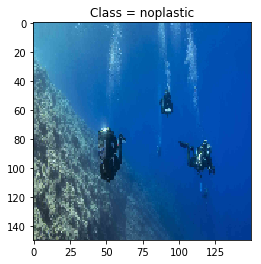

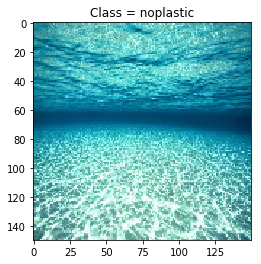

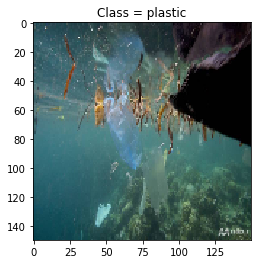

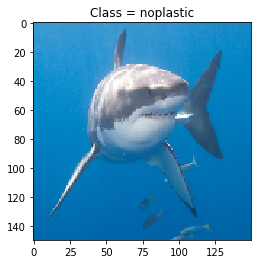

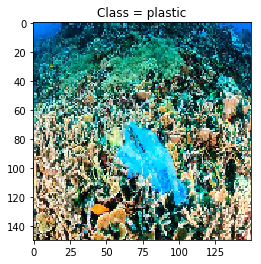

...

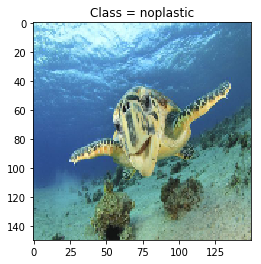

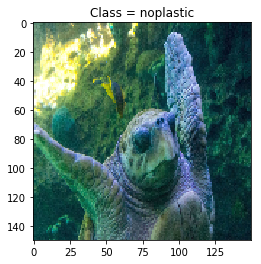

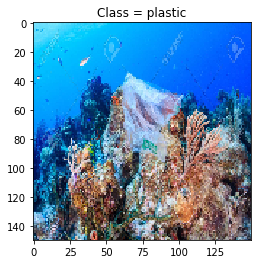

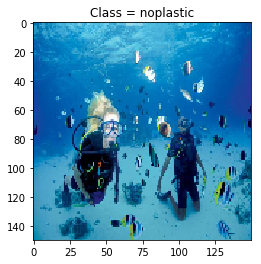

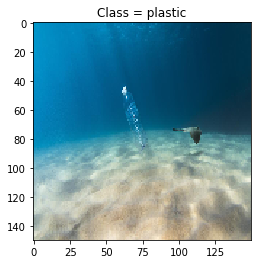

In [43]:
for X_batch, Y_batch in validation_generator:
    for i in range(len(Y_batch)):
        show_sample(X_batch[i, :, :, :], Y_batch[i])
    break

##### Looks like images were "lost" for some reason -> from 1600 training images, it only picked up 1587

Show some sample images from the dataset - borrow code from homework 5

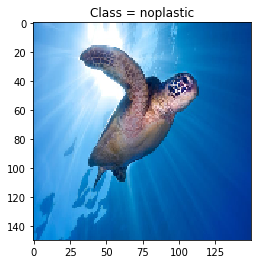

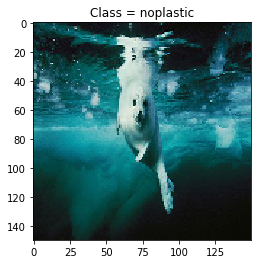

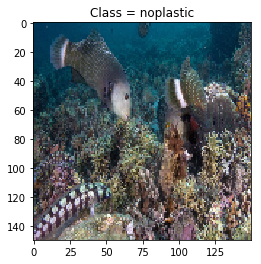

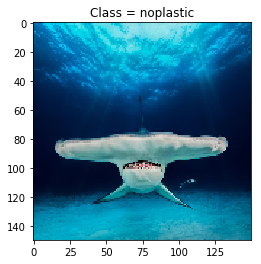

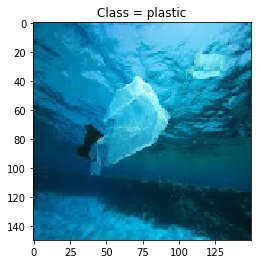

...

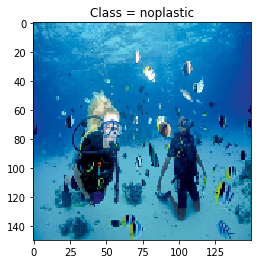

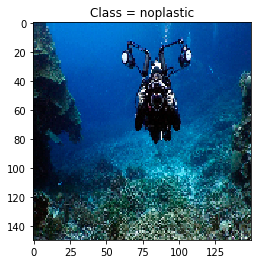

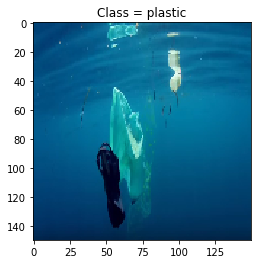

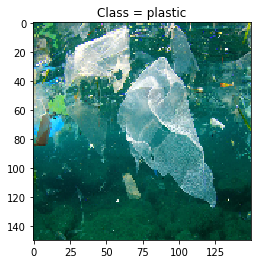

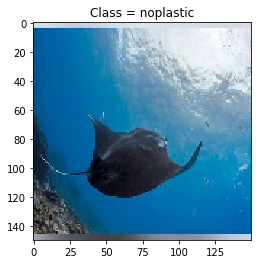

In [8]:
for X_batch, Y_batch in validation_generator:
    for i in range(len(Y_batch)):
        show_sample(X_batch[i, :, :, :], Y_batch[i])
    break

## 1. Simple ConvNet (from homework 5) 

In [9]:
model_scn = Sequential()
model_scn.add(Conv2D(32, (3, 3), input_shape=(img_width, img_height, 3)))
model_scn.add(Activation('relu'))
model_scn.add(MaxPooling2D(pool_size=(2, 2)))

model_scn.add(Conv2D(32, (3, 3)))
model_scn.add(Activation('relu'))
model_scn.add(MaxPooling2D(pool_size=(2, 2)))

model_scn.add(Conv2D(63, (3, 3)))
model_scn.add(Activation('relu'))
model_scn.add(MaxPooling2D(pool_size=(2, 2)))

model_scn.add(Flatten())
model_scn.add(Dense(64))
model_scn.add(Activation('relu'))
model_scn.add(Dropout(0.5))
model_scn.add(Dense(1))
model_scn.add(Activation('sigmoid'))

In [10]:
model_scn.compile(loss = 'binary_crossentropy',
              optimizer = 'rmsprop',
              metrics=['accuracy'])

print(model_scn.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
activation_1 (Activation)    (None, 148, 148, 32)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 72, 72, 32)        9248      
_________________________________________________________________
activation_2 (Activation)    (None, 72, 72, 32)        0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 36, 36, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 34, 34, 63)        18207     
__________

In [11]:
%pushd
%mkdir -p history
%mkdir -p models
%mkdir -p logs
%cd logs 
%mkdir -p ./scn
%mkdir -p ./vgg16_fine_tuning
%popd

/home/cd2821/final_project/dl_4_cv/logs
/home/cd2821/final_project/dl_4_cv
popd -> ~/final_project/dl_4_cv


In [12]:
tensorboard_callback_scn = TensorBoard(log_dir='./logs/scn/', 
                                       histogram_freq=0, write_graph=True, write_images=False)
checkpoint_callback_scn = ModelCheckpoint('./models/scn_weights.{epoch:02d}-{val_acc:.2f}.hdf5', 
                                          monitor='val_acc', verbose=0, save_best_only=True, 
                                          save_weights_only=False, mode='auto', period=1)

Instructions for updating:
Use the retry module or similar alternatives.


Train the model

In [13]:
%%time
nb_epoch_scn = 10

hist_scn = model_scn.fit_generator(train_generator, 
              initial_epoch=0, 
              verbose=1, 
              validation_data=validation_generator, 
              steps_per_epoch=steps_per_epoch_train, 
              epochs=nb_epoch_scn, 
              callbacks=[tensorboard_callback_scn, checkpoint_callback_scn],
              validation_steps=steps_per_epoch_val)
                                                                                                                                   
pandas.DataFrame(hist_scn.history).to_csv("./history/scn.csv")

Epoch 1/10
50/50 [==============================] - 50s 1s/step - loss: 0.6542 - acc: 0.6311 - val_loss: 0.6927 - val_acc: 0.6871
Epoch 2/10
50/50 [==============================] - 46s 916ms/step - loss: 0.6095 - acc: 0.6904 - val_loss: 0.6816 - val_acc: 0.6667
Epoch 3/10
50/50 [==============================] - 45s 909ms/step - loss: 0.5670 - acc: 0.7215 - val_loss: 0.6505 - val_acc: 0.6463
Epoch 4/10
50/50 [==============================] - 46s 913ms/step - loss: 0.5594 - acc: 0.7180 - val_loss: 0.7441 - val_acc: 0.6463
Epoch 5/10
50/50 [==============================] - 46s 915ms/step - loss: 0.5207 - acc: 0.7403 - val_loss: 0.6747 - val_acc: 0.6599
Epoch 6/10
50/50 [==============================] - 46s 915ms/step - loss: 0.5225 - acc: 0.7350 - val_loss: 0.5903 - val_acc: 0.7143
Epoch 7/10
50/50 [==============================] - 46s 913ms/step - loss: 0.4974 - acc: 0.7474 - val_loss: 0.5761 - val_acc: 0.7347
Epoch 8/10
50/50 [==============================] - 46s 918ms/step - los

Grab some validation batches and evaluate our accuracy:

In [14]:
accuracies_scn = np.array([])
losses_scn = np.array([])

i=0
for X_batch, Y_batch in validation_generator:
    loss, accuracy = model_scn.evaluate(X_batch, Y_batch, verbose=0)
    losses_scn = np.append(losses_scn, loss)
    accuracies_scn = np.append(accuracies_scn, accuracy)
    i += 1
    if i == 20:
       break
       
print("Validation: accuracy = %f  ;  loss = %f" % (np.mean(accuracies_scn), np.mean(losses_scn)))

Validation: accuracy = 0.702549  ;  loss = 0.536328


In [15]:
X_test, y_test = next(validation_generator)
predictions_scn = model_scn.predict_classes(X_test, batch_size=32, verbose=0)

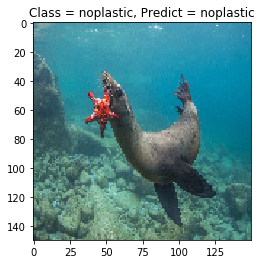

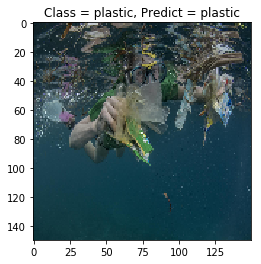

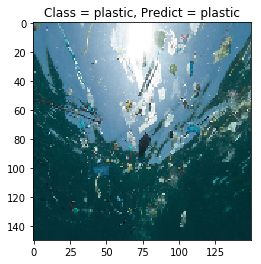

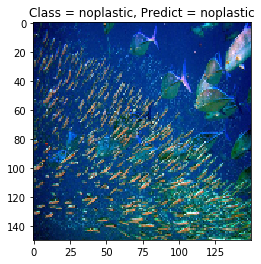

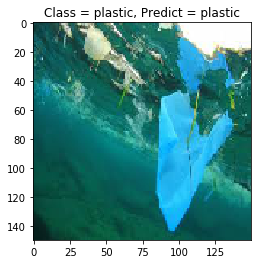

...

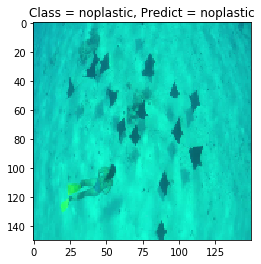

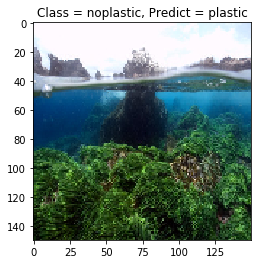

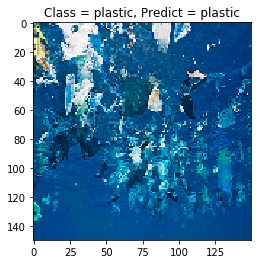

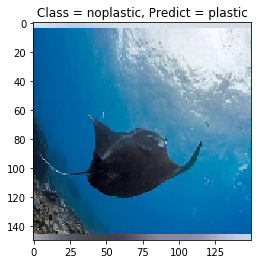

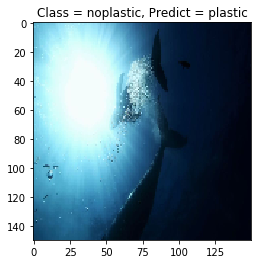

In [16]:
for i in range(32):
    show_sample(X_test[i, :, :, :], y_test[i], prediction=predictions_scn[i, 0])

Most of the mis-predictions were true label "plastic", but predicted "no plastic" -> seems like there is a bias in the model

Accuracy in this initial model was 70.7% - considerable, given the small dataset size (compare to the 10k of each cat/dog label in the cat/dog exercise we did).

However, we can likely do better by the following models.

## 2. Use a ConvNet (VGG16) that was pre-trained on ImageNet to see how we do

Let's try to build a more powerful ConvNet: VGG16. We will not train it from scratch but rather load in the weights for the model from a pre-trained version, version that was trained on ImageNet. We will then chop of the last layer and replace it with one that fits our two class plastic vs. no plastic problem. 

We will freeze the bottom layers of the network and only train the weights of the new last layers. Why? Because if we allow the whole model to train all the weights at once we might do damage to the carefully selected weights in the lower convolutional layers. So instead, we train only the top layer. 

This training produces a classifier that has 91% accuracy, which is quite an improvement over the last one. However, once this training converges, more or less, we then unfreeze the lower layers and let all the layers train. The final model gets 97% accuracy!

The routine below make a VGG16 network in either Theano or Tensorflow style. The only difference is the ordering of the volume indices. Note that it does not make the last layers as these would have to be removed.

In [17]:
def build_vgg16(framework='tf'):

    if framework == 'th':
        # build the VGG16 network in Theano weight ordering mode
        backend.set_image_dim_ordering('th')
    else:
        # build the VGG16 network in Tensorflow weight ordering mode
        backend.set_image_dim_ordering('tf')
        
    model = Sequential()
    if framework == 'th':
        model.add(ZeroPadding2D((1, 1), input_shape=(3, img_width, img_height)))
    else:
        model.add(ZeroPadding2D((1, 1), input_shape=(img_width, img_height, 3)))
        
    model.add(Conv2D(64, (3, 3), activation='relu', name='conv1_1'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(64, (3, 3), activation='relu', name='conv1_2'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(128, (3, 3), activation='relu', name='conv2_1'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(128, (3, 3), activation='relu', name='conv2_2'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(256, (3, 3), activation='relu', name='conv3_1'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(256, (3, 3), activation='relu', name='conv3_2'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(256, (3, 3), activation='relu', name='conv3_3'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(512, (3, 3), activation='relu', name='conv4_1'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(512, (3, 3), activation='relu', name='conv4_2'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(512, (3, 3), activation='relu', name='conv4_3'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(512, (3, 3), activation='relu', name='conv5_1'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(512, (3, 3), activation='relu', name='conv5_2'))
    model.add(ZeroPadding2D((1, 1)))
    model.add(Conv2D(512, (3, 3), activation='relu', name='conv5_3'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    
    return model

In [21]:
# path to the model weights files.
weights_path = '../weights/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'
# Pulled weights from (googled for them): https://github.com/MinerKasch/applied_deep_learning/blob
    # /master/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5
tf_model = build_vgg16('tf')
tf_model.load_weights(weights_path)

In [22]:
tf_model

In [23]:
# build a classifier model to put on top of the convolutional model
top_model = Sequential()
# print(Flatten(input_shape=tf_model.output_shape[1:]))
top_model.add(Flatten(input_shape=tf_model.output_shape[1:]))
top_model.add(Dense(256, activation='relu'))
top_model.add(Dropout(0.5))
top_model.add(Dense(1, activation='sigmoid'))
print(tf_model.summary())
print(top_model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d_40 (ZeroPaddi (None, 152, 152, 3)       0         
_________________________________________________________________
conv1_1 (Conv2D)             (None, 150, 150, 64)      1792      
_________________________________________________________________
zero_padding2d_41 (ZeroPaddi (None, 152, 152, 64)      0         
_________________________________________________________________
conv1_2 (Conv2D)             (None, 150, 150, 64)      36928     
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 75, 75, 64)        0         
_________________________________________________________________
zero_padding2d_42 (ZeroPaddi (None, 77, 77, 64)        0         
_________________________________________________________________
conv2_1 (Conv2D)             (None, 75, 75, 128)       73856     
__________

We add this model to the top of our VGG16 network, freeze all the weights except the top, and compile.

In [24]:
# add the model on top of the convolutional base
tf_model.add(top_model)

In [25]:
# set the first 25 layers (up to the last conv block)
# to non-trainable (weights will not be updated)
for layer in tf_model.layers[:25]:
    layer.trainable = False

# compile the model with a SGD/momentum optimizer
# and a very slow learning rate.
tf_model.compile(loss='binary_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),
              metrics=['accuracy'])

In [26]:
tf_model.layers[0].trainable

False

## 3. Train top model with frozen layers

Now we train for 5 epochs to get the weights for the top close to where we need them. Essentially, we want the network to be doing the right thing before we unnfreeze the lower weights.

In [27]:
tensorboard_callback_tt = TensorBoard(log_dir='./logs/train_top/', histogram_freq=0, write_graph=True, 
                                   write_images=False)
checkpoint_callback_tt = ModelCheckpoint('./models/train_top_weights.{epoch:02d}-{val_acc:.2f}.hdf5', 
                                      monitor='val_acc', verbose=0, save_best_only=True, save_weights_only=False, 
                                      mode='auto', period=1)

In [28]:
%%time
nb_epoch = 10

hist_train_top = tf_model.fit_generator(train_generator, 
              initial_epoch=0, 
              verbose=1, 
              validation_data=validation_generator, 
              steps_per_epoch=steps_per_epoch_train, 
              epochs=nb_epoch, 
              callbacks=[tensorboard_callback_tt, checkpoint_callback_tt],
              validation_steps=steps_per_epoch_val)
                                                                                                                                   
pandas.DataFrame(hist_train_top.history).to_csv("./history/train_top.csv")

Epoch 1/10
50/50 [==============================] - 51s 1s/step - loss: 0.7271 - acc: 0.5536 - val_loss: 0.6398 - val_acc: 0.7075
Epoch 2/10
50/50 [==============================] - 45s 904ms/step - loss: 0.6397 - acc: 0.6370 - val_loss: 0.5858 - val_acc: 0.7347
Epoch 3/10
50/50 [==============================] - 46s 927ms/step - loss: 0.5850 - acc: 0.6854 - val_loss: 0.5524 - val_acc: 0.7619
Epoch 4/10
50/50 [==============================] - 46s 924ms/step - loss: 0.5505 - acc: 0.7176 - val_loss: 0.5347 - val_acc: 0.7415
Epoch 5/10
50/50 [==============================] - 46s 927ms/step - loss: 0.5145 - acc: 0.7543 - val_loss: 0.4937 - val_acc: 0.8027
Epoch 6/10
50/50 [==============================] - 46s 924ms/step - loss: 0.5045 - acc: 0.7668 - val_loss: 0.4784 - val_acc: 0.7959
Epoch 7/10
50/50 [==============================] - 46s 928ms/step - loss: 0.4691 - acc: 0.7796 - val_loss: 0.4587 - val_acc: 0.7891
Epoch 8/10
50/50 [==============================] - 47s 931ms/step - los

In [29]:
accuracies_train_top = np.array([])
losses_train_top = np.array([])

i=0
for X_batch, Y_batch in validation_generator:
    loss, accuracy = tf_model.evaluate(X_batch, Y_batch, verbose=0)
    losses_train_top = np.append(losses_train_top, loss)
    accuracies_train_top = np.append(accuracies_train_top, accuracy)
    i += 1
    if i == 20:
       break
       
print("Validation train top: accuracy = %f  ;  loss = %f" % (np.mean(accuracies_train_top), 
                                                             np.mean(losses_train_top)))

Validation train top: accuracy = 0.840872  ;  loss = 0.394074


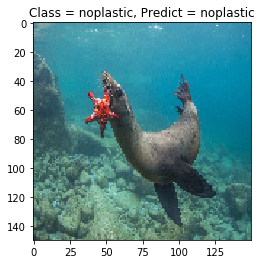

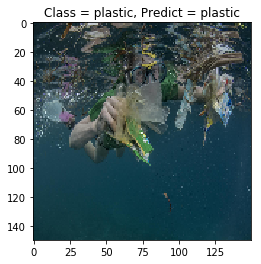

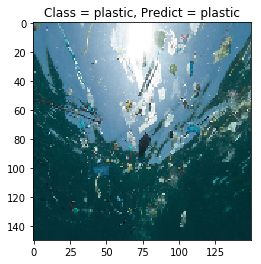

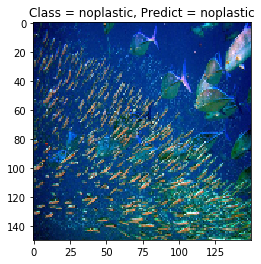

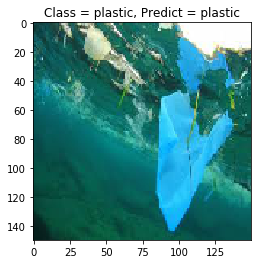

...

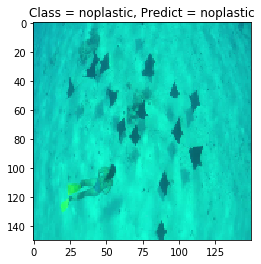

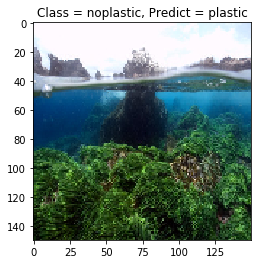

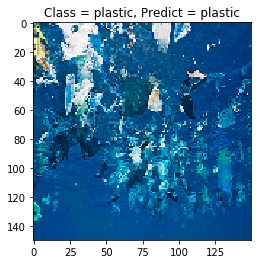

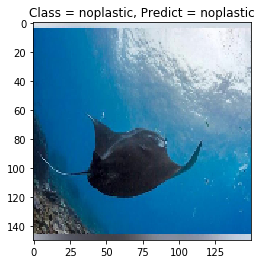

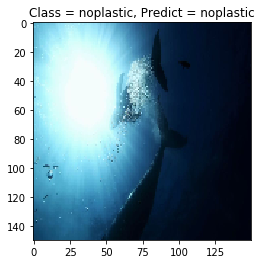

In [30]:
predictions_train_top = tf_model.predict_classes(X_test, batch_size=32, verbose=0)
for i in range(32):
    show_sample(X_test[i, :, :, :], y_test[i], prediction=predictions_train_top[i, 0])

## 4. Unfreeze all layers 

Unfreeze the lower layers

In [31]:
# set the first 25 layers (up to the last conv block)
# to trainable (weights will be updated)
for layer in tf_model.layers[:25]:
    layer.trainable = True

# compile the model with a SGD/momentum optimizer
# and a very slow learning rate.
tf_model.compile(loss='binary_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),
              metrics=['accuracy'])

In [32]:
tf_model.layers[0].trainable

True

Train model

In [33]:
tensorboard_callback_tt_unfreeze = TensorBoard(log_dir='./logs/train_top_unfreeze/', histogram_freq=0, 
                                               write_graph=True, write_images=False)
checkpoint_callback_tt_unfreeze = ModelCheckpoint(
                                './models/train_top_unfreeze_weights.{epoch:02d}-{val_acc:.2f}.hdf5', 
                                monitor='val_acc', verbose=0, save_best_only=True, 
                                save_weights_only=False, mode='auto', period=1)

nb_epoch_tt_unfreeze = 10

hist_train_top_unfreeze = tf_model.fit_generator(train_generator, 
              initial_epoch=0, 
              verbose=1, 
              validation_data=validation_generator, 
              steps_per_epoch=steps_per_epoch_train, 
              epochs=nb_epoch_tt_unfreeze, 
              callbacks=[tensorboard_callback_tt_unfreeze, checkpoint_callback_tt_unfreeze],
              validation_steps=steps_per_epoch_val)
                                                                                                                                   
pandas.DataFrame(hist_train_top_unfreeze.history).to_csv("./history/train_top_unfreeze.csv")

Epoch 1/10
50/50 [==============================] - 52s 1s/step - loss: 0.3977 - acc: 0.8237 - val_loss: 0.3779 - val_acc: 0.8367
Epoch 2/10
50/50 [==============================] - 46s 929ms/step - loss: 0.3585 - acc: 0.8435 - val_loss: 0.3709 - val_acc: 0.8367
Epoch 3/10
50/50 [==============================] - 46s 924ms/step - loss: 0.3392 - acc: 0.8499 - val_loss: 0.3435 - val_acc: 0.8435
Epoch 4/10
50/50 [==============================] - 46s 926ms/step - loss: 0.3382 - acc: 0.8506 - val_loss: 0.3565 - val_acc: 0.8639
Epoch 5/10
50/50 [==============================] - 46s 923ms/step - loss: 0.2729 - acc: 0.8914 - val_loss: 0.3012 - val_acc: 0.8912
Epoch 6/10
50/50 [==============================] - 46s 928ms/step - loss: 0.2764 - acc: 0.8884 - val_loss: 0.2921 - val_acc: 0.8503
Epoch 7/10
50/50 [==============================] - 46s 927ms/step - loss: 0.2447 - acc: 0.9011 - val_loss: 0.2961 - val_acc: 0.8980
Epoch 8/10
50/50 [==============================] - 46s 924ms/step - los

In [34]:
accuracies_train_top_unfreeze = np.array([])
losses_train_top_unfreeze = np.array([])

i=0
for X_batch, Y_batch in validation_generator:
    loss, accuracy = tf_model.evaluate(X_batch, Y_batch, verbose=0)
    losses_train_top_unfreeze = np.append(losses_train_top_unfreeze, loss)
    accuracies_train_top_unfreeze = np.append(accuracies_train_top_unfreeze, accuracy)
    i += 1
    if i == 20:
       break
       
print("Validation train top: accuracy = %f  ;  loss = %f" % (np.mean(accuracies_train_top_unfreeze), 
                                                             np.mean(losses_train_top_unfreeze)))

Validation train top: accuracy = 0.882648  ;  loss = 0.309591


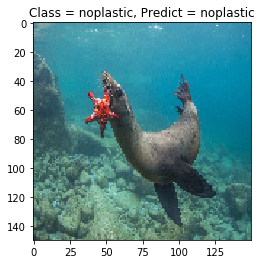

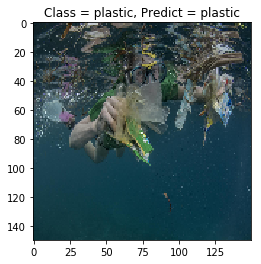

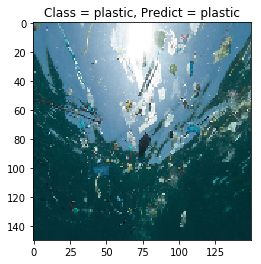

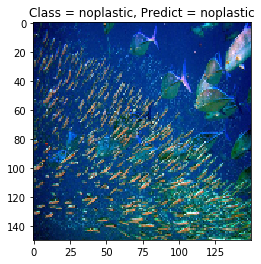

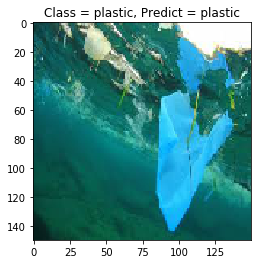

...

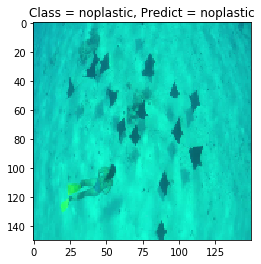

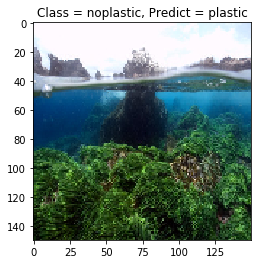

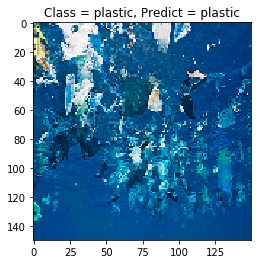

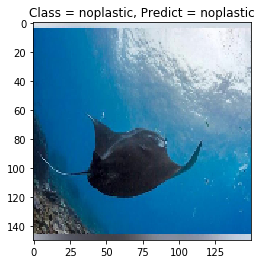

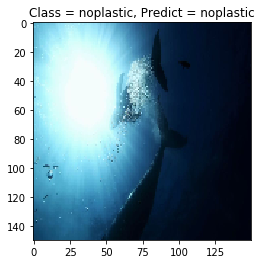

In [35]:
predictions_train_top_unfreeze = tf_model.predict_classes(X_test, batch_size=32, verbose=0)
for i in range(32):
    show_sample(X_test[i, :, :, :], y_test[i], prediction=predictions_train_top_unfreeze[i, 0])

We let it go one last time and see that it pushes up just a bit higher over 91%. Also note that it looks like it is beginning to overfit as the training loss is coming way down and the training accuracy is going well beyond the validation accuracy.

In [36]:
tensorboard_callback_tt_unfreeze_plus = TensorBoard(log_dir='./logs/train_top_unfreeze_plus/', histogram_freq=0, 
                                               write_graph=True, write_images=False)
checkpoint_callback_tt_unfreeze_plus = ModelCheckpoint(
                                './models/train_top_unfreeze_plus_weights.{epoch:02d}-{val_acc:.2f}.hdf5', 
                                monitor='val_acc', verbose=0, save_best_only=True, 
                                save_weights_only=False, mode='auto', period=1)

nb_epoch_tt_unfreeze_plus = 5

hist_train_top_unfreeze_plus = tf_model.fit_generator(train_generator, 
              initial_epoch=0, 
              verbose=1, 
              validation_data=validation_generator, 
              steps_per_epoch=steps_per_epoch_train, 
              epochs=nb_epoch_tt_unfreeze_plus, 
              callbacks=[tensorboard_callback_tt_unfreeze_plus, checkpoint_callback_tt_unfreeze_plus],
              validation_steps=steps_per_epoch_val)
                                                                                                                                   
pandas.DataFrame(hist_train_top_unfreeze_plus.history).to_csv("./history/train_top_unfreeze_plus.csv")

Epoch 1/5
50/50 [==============================] - 50s 1s/step - loss: 0.1785 - acc: 0.9320 - val_loss: 0.3750 - val_acc: 0.8844
Epoch 2/5
50/50 [==============================] - 46s 929ms/step - loss: 0.1821 - acc: 0.9344 - val_loss: 0.2101 - val_acc: 0.9184
Epoch 3/5
50/50 [==============================] - 46s 918ms/step - loss: 0.1808 - acc: 0.9301 - val_loss: 0.2497 - val_acc: 0.9048
Epoch 4/5
50/50 [==============================] - 46s 925ms/step - loss: 0.1698 - acc: 0.9347 - val_loss: 0.3462 - val_acc: 0.8844
Epoch 5/5
50/50 [==============================] - 46s 919ms/step - loss: 0.1460 - acc: 0.9425 - val_loss: 0.2422 - val_acc: 0.9116


In [37]:
accuracies_train_top_unfreeze_plus = np.array([])
losses_train_top_unfreeze_plus = np.array([])

i=0
for X_batch, Y_batch in validation_generator:
    loss, accuracy = tf_model.evaluate(X_batch, Y_batch, verbose=0)
    losses_train_top_unfreeze_plus = np.append(losses_train_top_unfreeze_plus, loss)
    accuracies_train_top_unfreeze_plus = np.append(accuracies_train_top_unfreeze_plus, accuracy)
    i += 1
    if i == 20:
       break
       
print("Validation train top: accuracy = %f  ;  loss = %f" % (np.mean(accuracies_train_top_unfreeze_plus), 
                                                             np.mean(losses_train_top_unfreeze_plus)))

Validation train top: accuracy = 0.909211  ;  loss = 0.249076


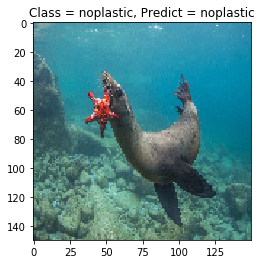

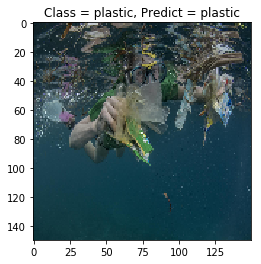

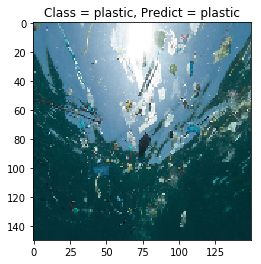

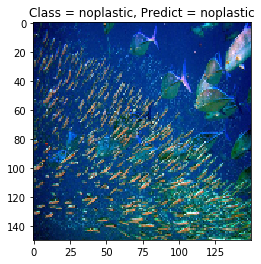

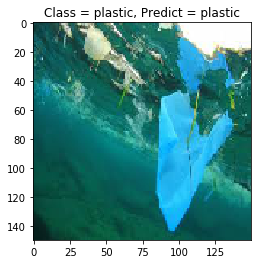

...

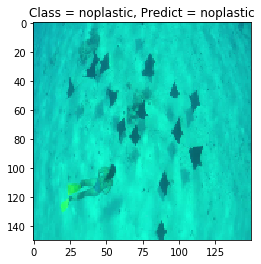

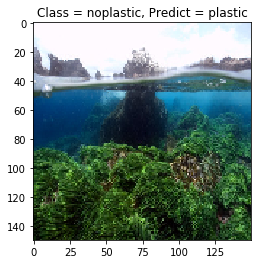

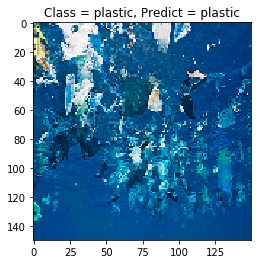

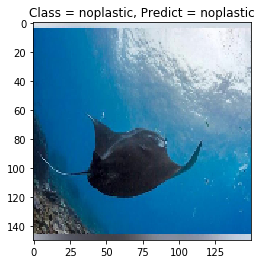

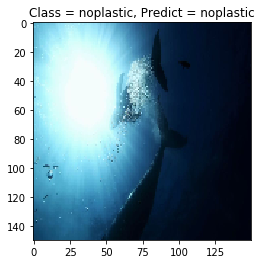

In [38]:
predictions_train_top_unfreeze_plus = tf_model.predict_classes(X_test, batch_size=32, verbose=0)
for i in range(32):
    show_sample(X_test[i, :, :, :], y_test[i], prediction=predictions_train_top_unfreeze_plus[i, 0])

90% accuracy! =) - not bad! 

## 4. Let's see if we can do better with ResNet! 

## 5. Let's move on to Object Detection 

In [1]:
2

2

In [2]:
# From: https://www.pyimagesearch.com/2017/09/11/object-detection-with-deep-learning-and-opencv/

# USAGE
# python deep_learning_object_detection.py --image images/example_01.jpg \
#	--prototxt MobileNetSSD_deploy.prototxt.txt --model MobileNetSSD_deploy.caffemodel

# import the necessary packages
import numpy as np
import argparse
import cv2

# construct the argument parse and parse the arguments
ap = argparse.ArgumentParser()
ap.add_argument("-i", "--image", required=True,
	help="path to input image")
ap.add_argument("-p", "--prototxt", required=True,
	help="path to Caffe 'deploy' prototxt file")
ap.add_argument("-m", "--model", required=True,
	help="path to Caffe pre-trained model")
ap.add_argument("-c", "--confidence", type=float, default=0.2,
	help="minimum probability to filter weak detections")
args = vars(ap.parse_args())

# initialize the list of class labels MobileNet SSD was trained to
# detect, then generate a set of bounding box colors for each class
CLASSES = ["background", "aeroplane", "bicycle", "bird", "boat",
	"bottle", "bus", "car", "cat", "chair", "cow", "diningtable",
	"dog", "horse", "motorbike", "person", "pottedplant", "sheep",
	"sofa", "train", "tvmonitor"]
COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

# load our serialized model from disk
print("[INFO] loading model...")
net = cv2.dnn.readNetFromCaffe(args["prototxt"], args["model"])

# load the input image and construct an input blob for the image
# by resizing to a fixed 300x300 pixels and then normalizing it
# (note: normalization is done via the authors of the MobileNet SSD
# implementation)
image = cv2.imread(args["image"])
(h, w) = image.shape[:2]
blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 0.007843, (300, 300), 127.5)

# pass the blob through the network and obtain the detections and
# predictions
print("[INFO] computing object detections...")
net.setInput(blob)
detections = net.forward()

# loop over the detections
for i in np.arange(0, detections.shape[2]):
	# extract the confidence (i.e., probability) associated with the
	# prediction
	confidence = detections[0, 0, i, 2]

	# filter out weak detections by ensuring the `confidence` is
	# greater than the minimum confidence
	if confidence > args["confidence"]:
		# extract the index of the class label from the `detections`,
		# then compute the (x, y)-coordinates of the bounding box for
		# the object
		idx = int(detections[0, 0, i, 1])
		box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
		(startX, startY, endX, endY) = box.astype("int")

		# display the prediction
		label = "{}: {:.2f}%".format(CLASSES[idx], confidence * 100)
		print("[INFO] {}".format(label))
		cv2.rectangle(image, (startX, startY), (endX, endY),
			COLORS[idx], 2)
		y = startY - 15 if startY - 15 > 15 else startY + 15
		cv2.putText(image, label, (startX, y),
			cv2.FONT_HERSHEY_SIMPLEX, 0.5, COLORS[idx], 2)

# show the output image
cv2.imshow("Output", image)
cv2.waitKey(0)

usage: ipykernel_launcher.py [-h] -i IMAGE -p PROTOTXT -m MODEL
                             [-c CONFIDENCE]
ipykernel_launcher.py: error: the following arguments are required: -i/--image, -p/--prototxt, -m/--model


SystemExit: 2

/Users/carmem/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2870: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [2]:
import matplotlib.pyplot as plt
%matplotlib inline

In [115]:
# From: https://www.pyimagesearch.com/2017/09/11/object-detection-with-deep-learning-and-opencv/

# import the necessary packages
import numpy as np
import argparse
import cv2

def obj_det(model, image):
    # modify args parsing from original code - make it into dict instead since not using
        # command line (Carmem's changes)
    args = {}
    args['image'] = image
    
    if model ==1:
        args["model"] = '../object-detection-deep-learning/MobileNetSSD_deploy.caffemodel'
        args["prototxt"] = '../object-detection-deep-learning/MobileNetSSD_deploy.prototxt.txt'
        # initialize the list of class labels MobileNet SSD was trained to
        # detect, then generate a set of bounding box colors for each class
        CLASSES = ["background", "aeroplane", "bicycle", "bird", "boat",
            "bottle", "bus", "car", "cat", "chair", "cow", "diningtable",
            "dog", "horse", "motorbike", "person", "pottedplant", "sheep",
            "sofa", "train", "tvmonitor"]
        COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))
#         args['image'] = '../object-detection-deep-learning/images/'+image
        # load the input image and construct an input blob for the image
        # by resizing to a fixed 300x300 pixels and then normalizing it
        # (note: normalization is done via the authors of the MobileNet SSD
        # implementation)
        image = cv2.imread(args["image"])
        (h, w) = image.shape[:2]
        blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 0.007843, (300, 300), 127.5)


    elif model ==2:
        args["prototxt"] = '../deep-learning-opencv/bvlc_googlenet.prototxt'
        args["model"] = '../deep-learning-opencv/bvlc_googlenet.caffemodel'
        args["labels"] = '../deep-learning-opencv/synset_words.txt' 
        # load the class labels from disk
        rows = open(args["labels"]).read().strip().split("\n")
        CLASSES = [r[r.find(" ") + 1:].split(",")[0] for r in rows]
        COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))
#         args['image'] = '../deep-learning-opencv/images/'+image
        # load the input image from disk
        image = cv2.imread(args["image"])
        (h, w) = image.shape[:2]
        # our CNN requires fixed spatial dimensions for our input image(s)
        # so we need to ensure it is resized to 224x224 pixels while
        # performing mean subtraction (104, 117, 123) to normalize the input;
        # after executing this command our "blob" now has the shape:
        # (1, 3, 224, 224)
        blob = cv2.dnn.blobFromImage(image, 1, (224, 224), (104, 117, 123))

    
#     args['image'] = image
    print("____ Image:", args['image'])
    print("____ Classes list:", CLASSES)
    
    args["confidence"] = 0.2

    # initialize the list of class labels MobileNet SSD was trained to
    # detect, then generate a set of bounding box colors for each class
#     CLASSES = ["background", "aeroplane", "bicycle", "bird", "boat",
#         "bottle", "bus", "car", "cat", "chair", "cow", "diningtable",
#         "dog", "horse", "motorbike", "person", "pottedplant", "sheep",
#         "sofa", "train", "tvmonitor"]
#     COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

    # Try to expand the set of classes, using the ones from imagenet

    # args["prototxt"] = '../deep-learning-opencv/bvlc_googlenet.prototxt'
    # args["model"] = '../deep-learning-opencv/bvlc_googlenet.caffemodel'
    # args["labels"] = '../deep-learning-opencv/synset_words.txt' 
    # # load the class labels from disk
    # rows = open(args["labels"]).read().strip().split("\n")
    # CLASSES = [r[r.find(" ") + 1:].split(",")[0] for r in rows]
    # COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

    # --prototxt bvlc_googlenet.prototxt --model bvlc_googlenet.caffemodel 
    # --labels synset_words.txt



    # load our serialized model from disk
    print("[INFO] loading model...")
    net = cv2.dnn.readNetFromCaffe(args["prototxt"], args["model"])

    # load the input image and construct an input blob for the image
    # by resizing to a fixed 300x300 pixels and then normalizing it
    # (note: normalization is done via the authors of the MobileNet SSD
    # implementation)
#     image = cv2.imread(args["image"])
#     (h, w) = image.shape[:2]
#     blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 0.007843, (300, 300), 127.5)

    # pass the blob through the network and obtain the detections and
    # predictions
    print("[INFO] computing object detections...")
    net.setInput(blob)
    detections = net.forward()

    print("_____ w:", w)
    print("_____ h:", h)
    print("_____ Detections:")
    print(detections)
    print(len(detections))
    print("detections shape: ", detections.shape)
    print("detections shape[2]: ", detections.shape[2])
    
    if model == 1: 
        
        # loop over the detections
        for i in np.arange(0, detections.shape[2]):
            # extract the confidence (i.e., probability) associated with the
            # prediction
            confidence = detections[0, 0, i, 2]
            print("i is: ", i)
            print("confidence:", confidence)

            # filter out weak detections by ensuring the `confidence` is
            # greater than the minimum confidence
            if confidence > args["confidence"]:
                # extract the index of the class label from the `detections`,
                # then compute the (x, y)-coordinates of the bounding box for
                # the object
                idx = int(detections[0, 0, i, 1])
                box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                (startX, startY, endX, endY) = box.astype("int")

                # display the prediction
                label = "{}: {:.2f}%".format(CLASSES[idx], confidence * 100)
                print("[INFO] {}".format(label))
                cv2.rectangle(image, (startX, startY), (endX, endY),
                    COLORS[idx], 2)
                y = startY - 15 if startY - 15 > 15 else startY + 15
                cv2.putText(image, label, (startX, y),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, COLORS[idx], 2)
                
    elif model == 2:
        # loop over the detections
        for i in np.arange(0, detections.shape[2]):
            # extract the confidence (i.e., probability) associated with the
            # prediction
            confidence = detections[0, 0, i, 2]

            # filter out weak detections by ensuring the `confidence` is
            # greater than the minimum confidence
            if confidence > args["confidence"]:
                # extract the index of the class label from the `detections`,
                # then compute the (x, y)-coordinates of the bounding box for
                # the object
                idx = int(detections[0, 0, i, 1])
                box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                (startX, startY, endX, endY) = box.astype("int")

                # display the prediction
                label = "{}: {:.2f}%".format(CLASSES[idx], confidence * 100)
                print("[INFO] {}".format(label))
                cv2.rectangle(image, (startX, startY), (endX, endY),
                    COLORS[idx], 2)
                y = startY - 15 if startY - 15 > 15 else startY + 15
                cv2.putText(image, label, (startX, y),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, COLORS[idx], 2)

    # show the output image
    # cv2.imshow("Output", image)
    # cv2.waitKey(5)
    plt.imshow(image)
    # plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
    plt.show()
    
    return net, detections, w, h

____ Image: ../deep-learning-opencv/images/eagle.png
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
_____ w: 400
_____ h: 500
_____ Detections:
[[[[0.         3.         0.99980134 0.02938682 0.1983597  0.86061245
    0.98448694]]]]
1
detections shape:  (1, 1, 1, 7)
[INFO] bird: 99.98%


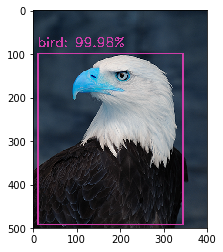

In [53]:
net_od, dets, w, h = obj_det(1, img2)

In [54]:
dets

array([[[[0.        , 3.        , 0.99980134, 0.02938682, 0.1983597 ,
          0.86061245, 0.98448694]]]], dtype=float32)

In [55]:
dets[0, 0, 0, 3]

0.029386818

In [56]:
dets[0, 0, 1, 0]

IndexError: index 1 is out of bounds for axis 2 with size 1

In [57]:
dets[0, 0, 0, 3:7]

array([0.02938682, 0.1983597 , 0.86061245, 0.98448694], dtype=float32)

In [58]:
w, h

(400, 500)

In [60]:
np.array([w, h, w, h])

array([400, 500, 400, 500])

In [61]:
dets[0, 0, 0, 3:7] * np.array([w, h, w, h])

array([ 11.75472736,  99.17984903, 344.24498081, 492.24346876])

In [59]:
net_od2, dets2, w2, h2 = obj_det(2, img2)

____ Image: ../deep-learning-opencv/images/eagle.png
____ Classes list: ['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead', 'electric ray', 'stingray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch', 'house finch', 'junco', 'indigo bunting', 'robin', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel', 'kite', 'bald eagle', 'vulture', 'great grey owl', 'European fire salamander', 'common newt', 'eft', 'spotted salamander', 'axolotl', 'bullfrog', 'tree frog', 'tailed frog', 'loggerhead', 'leatherback turtle', 'mud turtle', 'terrapin', 'box turtle', 'banded gecko', 'common iguana', 'American chameleon', 'whiptail', 'agama', 'frilled lizard', 'alligator lizard', 'Gila monster', 'green lizard', 'African chameleon', 'Komodo dragon', 'African crocodile', 'American alligator', 'triceratops', 'thunder snake', 'ringneck snake', 'hognose snake', 'green snake', 'king snake', 'garter snake', 'water snake', 'vine snake', 'night snake', 'boa constrictor', 'rock python', 'In

_____ w: 400
_____ h: 500
_____ Detections:
[[9.19020502e-13 1.61364205e-12 3.10316245e-10 8.90108907e-12
  5.54573679e-11 1.93566621e-11 4.98924568e-10 7.24718419e-08
  1.42872821e-07 1.58031321e-09 3.54614205e-09 3.95240427e-08
  1.08644223e-07 2.31570207e-09 1.68624490e-06 1.72018122e-09
  6.97216118e-10 5.94517360e-06 1.06112211e-05 1.15140057e-08
  6.64414245e-07 3.19638364e-02 9.67684805e-01 2.35955304e-04
  5.40044134e-08 1.17803242e-13 2.56967028e-13 3.53500568e-13
  2.30999464e-12 9.93662075e-13 4.46004860e-13 2.82511780e-13
  1.32422963e-13 6.15493420e-12 1.96374219e-11 1.29000231e-11
  1.78149908e-11 1.05466352e-12 6.56255920e-13 2.36402217e-11
  3.04817629e-11 8.74215544e-12 4.70922745e-11 6.10858863e-11
  4.66205308e-13 1.30437675e-12 3.32251275e-11 1.79365203e-13
  1.10264163e-12 4.15971294e-13 4.50648373e-12 1.05472380e-12
  1.41175342e-12 2.53342865e-13 6.09522198e-13 3.95352479e-13
  7.66107148e-14 2.42509924e-13 4.84405528e-12 2.14979270e-10
  7.98189314e-13 4.8693631

IndexError: tuple index out of range

[INFO] loading model...
[INFO] classification took 0.043658 seconds
[INFO] 1. label: bald eagle, probability: 0.96768
[INFO] 2. label: kite, probability: 0.031964
[INFO] 3. label: vulture, probability: 0.00023596
[INFO] 4. label: albatross, probability: 6.3654e-05
[INFO] 5. label: black grouse, probability: 1.6147e-05


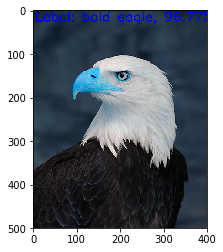

<dnn_Net 0x1340c5810>

In [41]:
dl_cv(img2)

____ Image: ../object-detection-deep-learning/images/example_01.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
_____ w: 800
_____ h: 600
_____ Detections:
[[[[0.         7.         0.99956423 0.53813225 0.52690107 0.8836376
    0.8247817 ]
   [0.         7.         0.9567941  0.10046512 0.5005842  0.35976034
    0.76231486]]]]
1
detections shape:  (1, 1, 2, 7)
[INFO] car: 99.96%
[INFO] car: 95.68%


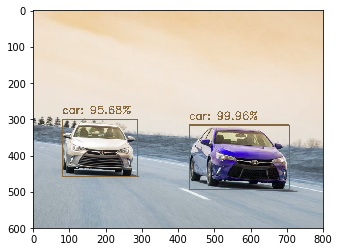

In [62]:
net_od, dets, w, h = obj_det(1, img1)

[INFO] loading model...
[INFO] classification took 0.078711 seconds
[INFO] 1. label: minivan, probability: 0.47079
[INFO] 2. label: beach wagon, probability: 0.44014
[INFO] 3. label: minibus, probability: 0.019711
[INFO] 4. label: jeep, probability: 0.019353
[INFO] 5. label: racer, probability: 0.0096239


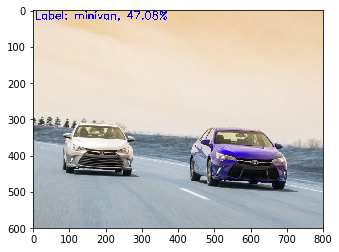

<dnn_Net 0x11a6b9e30>

In [63]:
dl_cv(img1)

In [64]:
obj_det(2, img1)

____ Image: ../object-detection-deep-learning/images/example_01.jpg
____ Classes list: ['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead', 'electric ray', 'stingray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch', 'house finch', 'junco', 'indigo bunting', 'robin', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel', 'kite', 'bald eagle', 'vulture', 'great grey owl', 'European fire salamander', 'common newt', 'eft', 'spotted salamander', 'axolotl', 'bullfrog', 'tree frog', 'tailed frog', 'loggerhead', 'leatherback turtle', 'mud turtle', 'terrapin', 'box turtle', 'banded gecko', 'common iguana', 'American chameleon', 'whiptail', 'agama', 'frilled lizard', 'alligator lizard', 'Gila monster', 'green lizard', 'African chameleon', 'Komodo dragon', 'African crocodile', 'American alligator', 'triceratops', 'thunder snake', 'ringneck snake', 'hognose snake', 'green snake', 'king snake', 'garter snake', 'water snake', 'vine snake', 'night snake', 'boa constrictor', 'ro

_____ w: 800
_____ h: 600
_____ Detections:
[[1.13887188e-06 9.91643034e-08 1.42031141e-07 1.27357351e-08
  1.54083590e-08 2.04783142e-08 1.85450624e-08 5.16061505e-08
  9.41625160e-08 8.73776003e-08 2.38641604e-08 8.43423749e-08
  4.88338188e-08 1.38263303e-08 3.68055026e-08 5.59314159e-08
  4.42467893e-08 1.38639074e-08 8.91832599e-08 1.75703974e-07
  4.42309229e-08 3.52892499e-07 1.87881128e-07 2.28504518e-07
  1.51262238e-08 1.96027258e-07 8.00351927e-08 6.94065960e-08
  1.64565719e-07 2.18965113e-07 6.56982456e-06 4.69432194e-07
  4.10346456e-06 1.30411818e-05 8.97080026e-05 1.10938627e-05
  6.29858550e-06 1.49313325e-06 2.29938536e-07 1.08298411e-06
  7.54076780e-07 3.14377132e-07 7.56139173e-07 2.56789470e-08
  1.47562886e-07 1.14338633e-07 3.72275792e-07 1.24486530e-06
  1.44539385e-07 6.67442691e-07 5.00964994e-08 4.55191724e-08
  3.13118363e-07 1.00364801e-07 4.84389432e-07 8.52854001e-08
  3.33369400e-07 9.73234791e-08 2.25445251e-06 1.40756342e-07
  1.74517527e-06 6.2109643

IndexError: tuple index out of range

In [40]:
img1 = '../object-detection-deep-learning/images/example_01.jpg'
img2 = '../deep-learning-opencv/images/eagle.png'
img3 = '../Images/data_for_modeling/train/plastic/2.sei_2320463.jpg'

In [7]:
net_od

<dnn_Net 0x110473110>

In [120]:
img4 = '../Images/data_for_modeling/train/plastic/1_1.jpg'

____ Image: ../Images/data_for_modeling/train/plastic/1_1.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 39.31%
[INFO] bottle: 38.37%


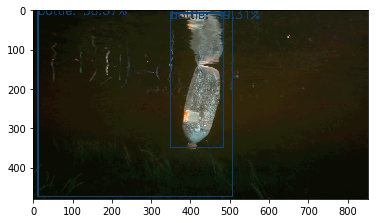

<dnn_Net 0x108d4ba10>

In [72]:
obj_det(1, img4)

In [39]:
# From: https://www.pyimagesearch.com/2017/08/21/deep-learning-with-opencv/

# USAGE
# python deep_learning_with_opencv.py --image images/jemma.png 
# --prototxt bvlc_googlenet.prototxt --model bvlc_googlenet.caffemodel 
# --labels synset_words.txt

# import the necessary packages
import numpy as np
import argparse
import time
import cv2


def dl_cv(image):
    # construct the argument parse and parse the arguments
    # ap = argparse.ArgumentParser()
    # ap.add_argument("-i", "--image", required=True,
    # 	help="path to input image")
    # ap.add_argument("-p", "--prototxt", required=True,
    # 	help="path to Caffe 'deploy' prototxt file")
    # ap.add_argument("-m", "--model", required=True,
    # 	help="path to Caffe pre-trained model")
    # ap.add_argument("-l", "--labels", required=True,
    # 	help="path to ImageNet labels (i.e., syn-sets)")
    # args = vars(ap.parse_args())

    args = {}
    args["prototxt"] = '../deep-learning-opencv/bvlc_googlenet.prototxt'
    args["model"] = '../deep-learning-opencv/bvlc_googlenet.caffemodel'
    args["labels"] = '../deep-learning-opencv/synset_words.txt' 
    # load the class labels from disk
    # rows = open(args["labels"]).read().strip().split("\n")
    # CLASSES = [r[r.find(" ") + 1:].split(",")[0] for r in rows]
    # COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))
    args['image'] = image



    # load the input image from disk
    image = cv2.imread(args["image"])

    # load the class labels from disk
    rows = open(args["labels"]).read().strip().split("\n")
    classes = [r[r.find(" ") + 1:].split(",")[0] for r in rows]

    # our CNN requires fixed spatial dimensions for our input image(s)
    # so we need to ensure it is resized to 224x224 pixels while
    # performing mean subtraction (104, 117, 123) to normalize the input;
    # after executing this command our "blob" now has the shape:
    # (1, 3, 224, 224)
    blob = cv2.dnn.blobFromImage(image, 1, (224, 224), (104, 117, 123))

    # load our serialized model from disk
    print("[INFO] loading model...")
    net = cv2.dnn.readNetFromCaffe(args["prototxt"], args["model"])

    # set the blob as input to the network and perform a forward-pass to
    # obtain our output classification
    net.setInput(blob)
    start = time.time()
    preds = net.forward()
    end = time.time()
    print("[INFO] classification took {:.5} seconds".format(end - start))

    # sort the indexes of the probabilities in descending order (higher
    # probabilitiy first) and grab the top-5 predictions
    idxs = np.argsort(preds[0])[::-1][:5]

    # loop over the top-5 predictions and display them
    for (i, idx) in enumerate(idxs):
        # draw the top prediction on the input image
        if i == 0:
            text = "Label: {}, {:.2f}%".format(classes[idx],
                preds[0][idx] * 100)
            cv2.putText(image, text, (5, 25),  cv2.FONT_HERSHEY_SIMPLEX,
                1, (0, 0, 255), 2)

        # display the predicted label + associated probability to the
        # console	
        print("[INFO] {}. label: {}, probability: {:.5}".format(i + 1,
            classes[idx], preds[0][idx]))

    # display the output image
    # cv2.imshow("Image", image)
    # cv2.waitKey(0)
    plt.imshow(image)
    # plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
    plt.show()
    
    return net

[INFO] loading model...
[INFO] classification took 0.039844 seconds
[INFO] 1. label: snorkel, probability: 0.38191
[INFO] 2. label: scuba diver, probability: 0.13585
[INFO] 3. label: reel, probability: 0.096081
[INFO] 4. label: fountain, probability: 0.035336
[INFO] 5. label: water snake, probability: 0.026734


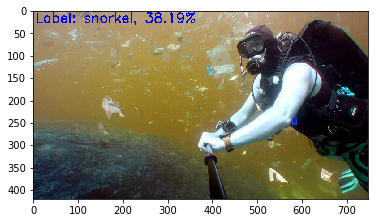

In [74]:
net_dl = dl_cv(img3)

In [75]:
net_dl

<dnn_Net 0x101f76870>

[INFO] loading model...
[INFO] classification took 0.043155 seconds
[INFO] 1. label: American alligator, probability: 0.56173
[INFO] 2. label: platypus, probability: 0.30649
[INFO] 3. label: barracouta, probability: 0.037893
[INFO] 4. label: airship, probability: 0.0081057
[INFO] 5. label: eel, probability: 0.0080888


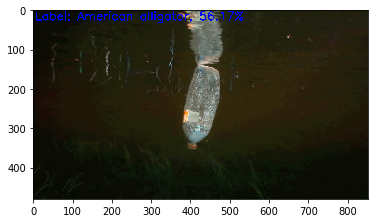

<dnn_Net 0x101eb6fb0>

In [76]:
dl_cv(img4)

In [65]:
img5 = '../Images/data_for_modeling/train/plastic/1.ocean-plastic-garbage-patch.jpg'

____ Image: ../Images/data_for_modeling/train/plastic/1. ocean-plastic-garbage-patch.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
[INFO] diningtable: 91.71%


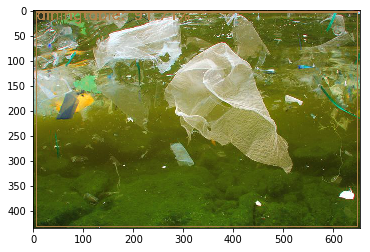

<dnn_Net 0x101f5bed0>

In [78]:
obj_det(1, img5)

[INFO] loading model...
[INFO] classification took 0.041406 seconds
[INFO] 1. label: plastic bag, probability: 0.60415
[INFO] 2. label: stingray, probability: 0.23569
[INFO] 3. label: shower cap, probability: 0.020077
[INFO] 4. label: spider web, probability: 0.020014
[INFO] 5. label: diaper, probability: 0.012154


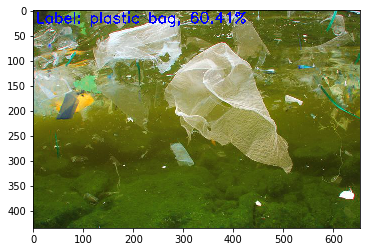

<dnn_Net 0x10f40e070>

In [79]:
dl_cv(img5)

In [80]:
images = [img1, img2, img3, img4, img5]

____ Image: ../object-detection-deep-learning/images/example_01.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
[INFO] car: 99.96%
[INFO] car: 95.68%


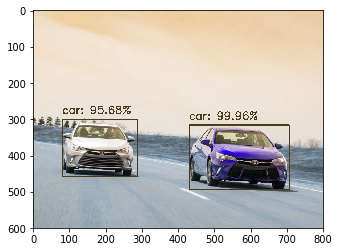

____ Image: ../deep-learning-opencv/images/eagle.png
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
[INFO] bird: 99.98%


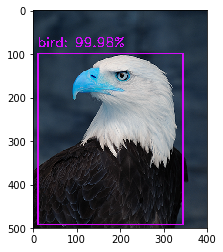

____ Image: ../Images/data_for_modeling/train/plastic/2.sei_2320463.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
[INFO] person: 98.48%


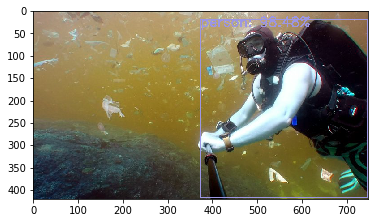

____ Image: ../Images/data_for_modeling/train/plastic/1_1.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
[INFO] bottle: 39.31%
[INFO] bottle: 38.37%


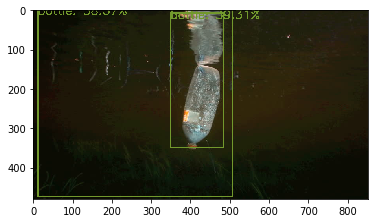

____ Image: ../Images/data_for_modeling/train/plastic/1. ocean-plastic-garbage-patch.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
[INFO] diningtable: 91.71%


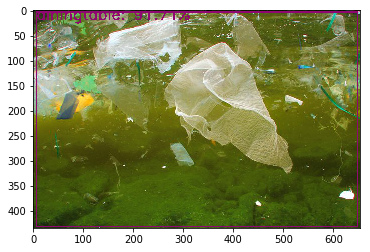

In [81]:
# Run the code from Blog 1 on all the sample images - cars and eagle are test images, 
    # others are my dataset images
for im in images:
    obj_det(1, im)

[INFO] loading model...
[INFO] classification took 0.04223 seconds
[INFO] 1. label: minivan, probability: 0.47079
[INFO] 2. label: beach wagon, probability: 0.44014
[INFO] 3. label: minibus, probability: 0.019711
[INFO] 4. label: jeep, probability: 0.019353
[INFO] 5. label: racer, probability: 0.0096239


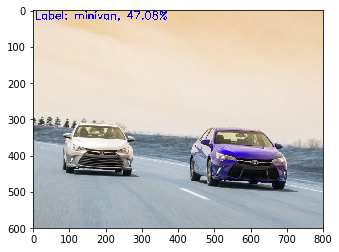

[INFO] loading model...
[INFO] classification took 0.04807 seconds
[INFO] 1. label: bald eagle, probability: 0.96768
[INFO] 2. label: kite, probability: 0.031964
[INFO] 3. label: vulture, probability: 0.00023596
[INFO] 4. label: albatross, probability: 6.3654e-05
[INFO] 5. label: black grouse, probability: 1.6147e-05


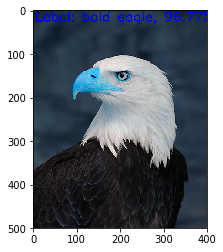

[INFO] loading model...
[INFO] classification took 0.048416 seconds
[INFO] 1. label: snorkel, probability: 0.38191
[INFO] 2. label: scuba diver, probability: 0.13585
[INFO] 3. label: reel, probability: 0.096081
[INFO] 4. label: fountain, probability: 0.035336
[INFO] 5. label: water snake, probability: 0.026734


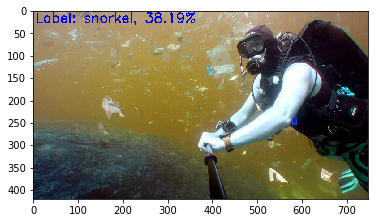

[INFO] loading model...
[INFO] classification took 0.044607 seconds
[INFO] 1. label: American alligator, probability: 0.56173
[INFO] 2. label: platypus, probability: 0.30649
[INFO] 3. label: barracouta, probability: 0.037893
[INFO] 4. label: airship, probability: 0.0081057
[INFO] 5. label: eel, probability: 0.0080888


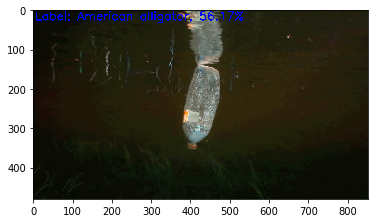

[INFO] loading model...
[INFO] classification took 0.046509 seconds
[INFO] 1. label: plastic bag, probability: 0.60415
[INFO] 2. label: stingray, probability: 0.23569
[INFO] 3. label: shower cap, probability: 0.020077
[INFO] 4. label: spider web, probability: 0.020014
[INFO] 5. label: diaper, probability: 0.012154


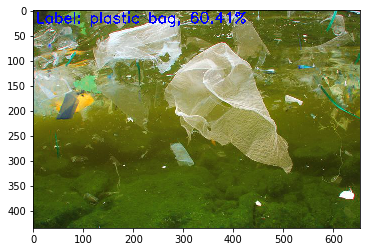

In [82]:
# Run the code from Blog 2 on all the sample images - cars and eagle are test images, 
    # others are my dataset images
for im in images:
    dl_cv(im)

In [74]:
flabels = open('../caffe/data/ILSVRC2016/labelmap_ilsvrc_det.prototxt', 'r') 
contents = flabels.read()

In [75]:
contents

'item {\n  name: "none_of_the_above"\n  label: 0\n  display_name: "background"\n}\nitem {\n  name: "n02672831"\n  label: 1\n  display_name: "accordion"\n}\nitem {\n  name: "n02691156"\n  label: 2\n  display_name: "airplane"\n}\nitem {\n  name: "n02219486"\n  label: 3\n  display_name: "ant"\n}\nitem {\n  name: "n02419796"\n  label: 4\n  display_name: "antelope"\n}\nitem {\n  name: "n07739125"\n  label: 5\n  display_name: "apple"\n}\nitem {\n  name: "n02454379"\n  label: 6\n  display_name: "armadillo"\n}\nitem {\n  name: "n07718747"\n  label: 7\n  display_name: "artichoke"\n}\nitem {\n  name: "n02764044"\n  label: 8\n  display_name: "axe"\n}\nitem {\n  name: "n02766320"\n  label: 9\n  display_name: "baby_bed"\n}\nitem {\n  name: "n02769748"\n  label: 10\n  display_name: "backpack"\n}\nitem {\n  name: "n07693725"\n  label: 11\n  display_name: "bagel"\n}\nitem {\n  name: "n02777292"\n  label: 12\n  display_name: "balance_beam"\n}\nitem {\n  name: "n07753592"\n  label: 13\n  display_name: "

In [77]:
print(open('../caffe/data/ILSVRC2016/labelmap_ilsvrc_det.prototxt', 'r').read())

item {
  name: "none_of_the_above"
  label: 0
  display_name: "background"
}
item {
  name: "n02672831"
  label: 1
  display_name: "accordion"
}
item {
  name: "n02691156"
  label: 2
  display_name: "airplane"
}
item {
  name: "n02219486"
  label: 3
  display_name: "ant"
}
item {
  name: "n02419796"
  label: 4
  display_name: "antelope"
}
item {
  name: "n07739125"
  label: 5
  display_name: "apple"
}
item {
  name: "n02454379"
  label: 6
  display_name: "armadillo"
}
item {
  name: "n07718747"
  label: 7
  display_name: "artichoke"
}
item {
  name: "n02764044"
  label: 8
  display_name: "axe"
}
item {
  name: "n02766320"
  label: 9
  display_name: "baby_bed"
}
item {
  name: "n02769748"
  label: 10
  display_name: "backpack"
}
item {
  name: "n07693725"
  label: 11
  display_name: "bagel"
}
item {
  name: "n02777292"
  label: 12
  display_name: "balance_beam"
}
item {
  name: "n07753592"
  label: 13
  display_name: "banana"
}
item {
  name: "n02786058"
  label: 14
  display_name: "ban

In [78]:
contents.split('\n')

['item {',
 '  name: "none_of_the_above"',
 '  label: 0',
 '  display_name: "background"',
 '}',
 'item {',
 '  name: "n02672831"',
 '  label: 1',
 '  display_name: "accordion"',
 '}',
 'item {',
 '  name: "n02691156"',
 '  label: 2',
 '  display_name: "airplane"',
 '}',
 'item {',
 '  name: "n02219486"',
 '  label: 3',
 '  display_name: "ant"',
 '}',
 'item {',
 '  name: "n02419796"',
 '  label: 4',
 '  display_name: "antelope"',
 '}',
 'item {',
 '  name: "n07739125"',
 '  label: 5',
 '  display_name: "apple"',
 '}',
 'item {',
 '  name: "n02454379"',
 '  label: 6',
 '  display_name: "armadillo"',
 '}',
 'item {',
 '  name: "n07718747"',
 '  label: 7',
 '  display_name: "artichoke"',
 '}',
 'item {',
 '  name: "n02764044"',
 '  label: 8',
 '  display_name: "axe"',
 '}',
 'item {',
 '  name: "n02766320"',
 '  label: 9',
 '  display_name: "baby_bed"',
 '}',
 'item {',
 '  name: "n02769748"',
 '  label: 10',
 '  display_name: "backpack"',
 '}',
 'item {',
 '  name: "n07693725"',
 '  lab

In [79]:
len(contents.split('\n'))

1006

In [80]:
len(contents.split('}'))

202

In [85]:
contents.strip().split('}')

['item {\n  name: "none_of_the_above"\n  label: 0\n  display_name: "background"\n',
 '\nitem {\n  name: "n02672831"\n  label: 1\n  display_name: "accordion"\n',
 '\nitem {\n  name: "n02691156"\n  label: 2\n  display_name: "airplane"\n',
 '\nitem {\n  name: "n02219486"\n  label: 3\n  display_name: "ant"\n',
 '\nitem {\n  name: "n02419796"\n  label: 4\n  display_name: "antelope"\n',
 '\nitem {\n  name: "n07739125"\n  label: 5\n  display_name: "apple"\n',
 '\nitem {\n  name: "n02454379"\n  label: 6\n  display_name: "armadillo"\n',
 '\nitem {\n  name: "n07718747"\n  label: 7\n  display_name: "artichoke"\n',
 '\nitem {\n  name: "n02764044"\n  label: 8\n  display_name: "axe"\n',
 '\nitem {\n  name: "n02766320"\n  label: 9\n  display_name: "baby_bed"\n',
 '\nitem {\n  name: "n02769748"\n  label: 10\n  display_name: "backpack"\n',
 '\nitem {\n  name: "n07693725"\n  label: 11\n  display_name: "bagel"\n',
 '\nitem {\n  name: "n02777292"\n  label: 12\n  display_name: "balance_beam"\n',
 '\nitem {

In [86]:
items = contents.strip().split('}')

In [148]:
label_dict = {}
for item in items:
    print(item.strip('\n').split(' '))
    info = item.strip('\n').split(' ')
    label = info[7].split('\n')[0]
    name = info[4].split('\n')[0].replace('"', '')
    display_name = info[10].replace('"', '')
    print("label: ", label)
    print("name: ", name)
    print("display_name: ", display_name)
    label_dict[int(label)] = { 'name': name, 'display_name': display_name}

['item', '{\n', '', 'name:', '"none_of_the_above"\n', '', 'label:', '0\n', '', 'display_name:', '"background"']
label:  0
name:  none_of_the_above
display_name:  background
['item', '{\n', '', 'name:', '"n02672831"\n', '', 'label:', '1\n', '', 'display_name:', '"accordion"']
label:  1
name:  n02672831
display_name:  accordion
['item', '{\n', '', 'name:', '"n02691156"\n', '', 'label:', '2\n', '', 'display_name:', '"airplane"']
label:  2
name:  n02691156
display_name:  airplane
['item', '{\n', '', 'name:', '"n02219486"\n', '', 'label:', '3\n', '', 'display_name:', '"ant"']
label:  3
name:  n02219486
display_name:  ant
['item', '{\n', '', 'name:', '"n02419796"\n', '', 'label:', '4\n', '', 'display_name:', '"antelope"']
label:  4
name:  n02419796
display_name:  antelope
['item', '{\n', '', 'name:', '"n07739125"\n', '', 'label:', '5\n', '', 'display_name:', '"apple"']
label:  5
name:  n07739125
display_name:  apple
['item', '{\n', '', 'name:', '"n02454379"\n', '', 'label:', '6\n', '', 'disp

IndexError: list index out of range

In [100]:
label_dict

{'0': {'display_name': 'background', 'name': 'none_of_the_above'},
 '1': {'display_name': 'accordion', 'name': 'n02672831'},
 '10': {'display_name': 'backpack', 'name': 'n02769748'},
 '100': {'display_name': 'lamp', 'name': 'n03636649'},
 '101': {'display_name': 'laptop', 'name': 'n03642806'},
 '102': {'display_name': 'lemon', 'name': 'n07749582'},
 '103': {'display_name': 'lion', 'name': 'n02129165'},
 '104': {'display_name': 'lipstick', 'name': 'n03676483'},
 '105': {'display_name': 'lizard', 'name': 'n01674464'},
 '106': {'display_name': 'lobster', 'name': 'n01982650'},
 '107': {'display_name': 'maillot', 'name': 'n03710721'},
 '108': {'display_name': 'maraca', 'name': 'n03720891'},
 '109': {'display_name': 'microphone', 'name': 'n03759954'},
 '11': {'display_name': 'bagel', 'name': 'n07693725'},
 '110': {'display_name': 'microwave', 'name': 'n03761084'},
 '111': {'display_name': 'milk_can', 'name': 'n03764736'},
 '112': {'display_name': 'miniskirt', 'name': 'n03770439'},
 '113': {'

In [101]:
len(label_dict)

201

In [69]:
from caffe.proto import caffe_pb2

ModuleNotFoundError: No module named 'caffe'

In [157]:
# From: https://www.pyimagesearch.com/2017/09/11/object-detection-with-deep-learning-and-opencv/

# import the necessary packages
import numpy as np
import argparse
import cv2

def obj_det_ilsvrc16(image):
    # modify args parsing from original code - make it into dict instead since not using
        # command line (Carmem's changes)
    args = {}
    args['image'] = image
    
    args["model"] = '../caffe_VGGNetSSD_ILSVR2016_models/VGGNet/ILSVRC2016/SSD_300x300/VGG_ILSVRC2016_SSD_300x300_iter_440000.caffemodel'
    args["prototxt"] = '../caffe_VGGNetSSD_ILSVR2016_models/VGGNet/ILSVRC2016/SSD_300x300/deploy.prototxt'
    # initialize the list of class labels MobileNet SSD was trained to
    # detect, then generate a set of bounding box colors for each class
    
    
    
    CLASSES = ["background", "aeroplane", "bicycle", "bird", "boat",
        "bottle", "bus", "car", "cat", "chair", "cow", "diningtable",
        "dog", "horse", "motorbike", "person", "pottedplant", "sheep",
        "sofa", "train", "tvmonitor"]
    COLORS = np.random.uniform(0, 255, size=(len(label_dict), 3))
#         args['image'] = '../object-detection-deep-learning/images/'+image
    # load the input image and construct an input blob for the image
    # by resizing to a fixed 300x300 pixels and then normalizing it
    # (note: normalization is done via the authors of the MobileNet SSD
    # implementation)
    image = cv2.imread(args["image"])
    (h, w) = image.shape[:2]
    blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 0.007843, (300, 300), 127.5)

    
#     args['image'] = image
    print("____ Image:", args['image'])
    print("____ Classes list:", CLASSES)
    
    args["confidence"] = 0.05


    # load our serialized model from disk
    print("[INFO] loading model...")
    net = cv2.dnn.readNetFromCaffe(args["prototxt"], args["model"])

    # load the input image and construct an input blob for the image
    # by resizing to a fixed 300x300 pixels and then normalizing it
    # (note: normalization is done via the authors of the MobileNet SSD
    # implementation)
#     image = cv2.imread(args["image"])
#     (h, w) = image.shape[:2]
#     blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 0.007843, (300, 300), 127.5)

    # pass the blob through the network and obtain the detections and
    # predictions
    print("[INFO] computing object detections...")
    net.setInput(blob)
    detections = net.forward()

    print("_____ w:", w)
    print("_____ h:", h)
    print("_____ Detections:")
    print(detections)
    print(len(detections))
    print("detections shape: ", detections.shape)
    print("detections shape[2]: ", detections.shape[2])
    
        
    # loop over the detections
    for i in np.arange(0, detections.shape[2]):
        # extract the confidence (i.e., probability) associated with the
        # prediction
        confidence = detections[0, 0, i, 2]
        print("i is: ", i)
        print("confidence:", confidence)

        # filter out weak detections by ensuring the `confidence` is
        # greater than the minimum confidence
        if confidence > args["confidence"]:
            # extract the index of the class label from the `detections`,
            # then compute the (x, y)-coordinates of the bounding box for
            # the object
            idx = int(detections[0, 0, i, 1])
            print("idx:", idx)
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            (startX, startY, endX, endY) = box.astype("int")

            # display the prediction
            label = "{}: {:.2f}%".format(label_dict[idx]['display_name'], confidence * 100)
            print("[INFO] {}".format(label))
            cv2.rectangle(image, (startX, startY), (endX, endY),
                COLORS[idx], 2)
            y = startY - 15 if startY - 15 > 15 else startY + 15
            cv2.putText(image, label, (startX, y),
                cv2.FONT_HERSHEY_SIMPLEX, 1, COLORS[idx], 2)

    # show the output image
    # cv2.imshow("Output", image)
    # cv2.waitKey(5)
    plt.imshow(image)
    # plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
    plt.show()
    
    return net, detections, w, h

____ Image: ../object-detection-deep-learning/images/example_01.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
_____ w: 800
_____ h: 600
_____ Detections:
[[[[0.0000000e+00 1.6100000e+02 1.4128975e-02 5.0581682e-01
    5.1813316e-01 8.9342475e-01 8.3080077e-01]
   [0.0000000e+00 1.7700000e+02 1.2342638e-02 1.1226189e-01
    5.0125313e-01 9.2456377e-01 9.1060817e-01]
   [0.0000000e+00 1.8900000e+02 5.9339825e-02 3.0844986e-02
    1.4318120e-01 9.4892311e-01 9.5579576e-01]
   [0.0000000e+00 1.9700000e+02 2.8216545e-02 5.0581682e-01
    5.1813316e-01 8.9342475e-01 8.3080077e-01]
   [0.0000000e+00 1.9700000e+02 1.6353056e-02 1.1226189e-01
    5.0125313e-01 9.2456377e-01 9.1060817e-01]]]]
1
detections shape:  (1, 1, 5, 7)
detections shape[2]:  5
i

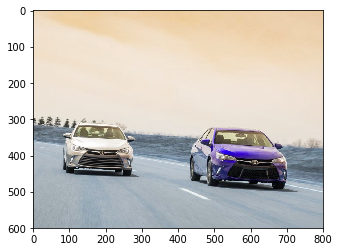

In [144]:
net, detections, w, h = obj_det_ilsvrc16(img1)

In [126]:
detections[0, 0, 0, 3:7]*np.array([w, h, w, h])

array([404.65345383, 310.87989807, 714.7397995 , 498.48046303])

In [136]:
detections[0, 0, 1, 1]

177.0

In [142]:
detections[0][0][0]

array([0.0000000e+00, 1.6100000e+02, 1.4128975e-02, 5.0581682e-01,
       5.1813316e-01, 8.9342475e-01, 8.3080077e-01], dtype=float32)

____ Image: ../object-detection-deep-learning/images/example_01.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
_____ w: 800
_____ h: 600
_____ Detections:
[[[[0.         7.         0.99956423 0.53813225 0.52690107 0.8836376
    0.8247817 ]
   [0.         7.         0.9567941  0.10046512 0.5005842  0.35976034
    0.76231486]]]]
1
detections shape:  (1, 1, 2, 7)
detections shape[2]:  2
i is:  0
confidence: 0.99956423
[INFO] car: 99.96%
i is:  1
confidence: 0.9567941
[INFO] car: 95.68%


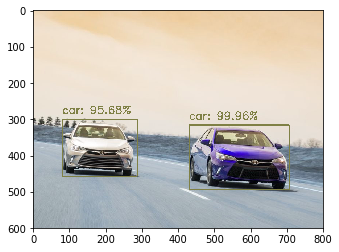

(<dnn_Net 0x12a6e4e50>,
 array([[[[0.        , 7.        , 0.99956423, 0.53813225, 0.52690107,
           0.8836376 , 0.8247817 ],
          [0.        , 7.        , 0.9567941 , 0.10046512, 0.5005842 ,
           0.35976034, 0.76231486]]]], dtype=float32),
 800,
 600)

In [116]:
obj_det(1, img1)

____ Image: ../Images/data_for_modeling/train/plastic/1_1.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
_____ w: 852
_____ h: 480
_____ Detections:
[[[[ 0.          5.          0.3931309   0.41031158  0.01573417
     0.56974214  0.72566795]
   [ 0.          5.          0.38369176  0.01472002 -0.00878254
     0.59462583  0.98751605]]]]
1
detections shape:  (1, 1, 2, 7)
detections shape[2]:  2
i is:  0
confidence: 0.3931309
[INFO] bottle: 39.31%
i is:  1
confidence: 0.38369176
[INFO] bottle: 38.37%


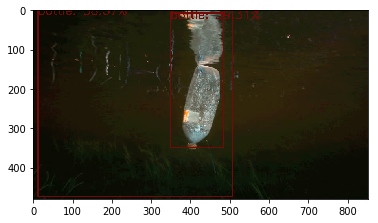

(<dnn_Net 0x11be88910>,
 array([[[[ 0.        ,  5.        ,  0.3931309 ,  0.41031158,
            0.01573417,  0.56974214,  0.72566795],
          [ 0.        ,  5.        ,  0.38369176,  0.01472002,
           -0.00878254,  0.59462583,  0.98751605]]]], dtype=float32),
 852,
 480)

In [121]:
obj_det(1, img4)

____ Image: ../deep-learning-opencv/images/eagle.png
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
_____ w: 400
_____ h: 500
_____ Detections:
[[[[0.00000000e+00 1.40000000e+01 3.56697477e-02 4.75017726e-02
    1.65522784e-01 8.86537075e-01 9.74089622e-01]
   [0.00000000e+00 1.80000000e+01 3.05341423e-01 6.29364848e-02
    1.64441407e-01 8.76794577e-01 9.63069141e-01]
   [0.00000000e+00 2.60000000e+01 2.35876888e-02 6.29364848e-02
    1.64441407e-01 8.76794577e-01 9.63069141e-01]
   [0.00000000e+00 5.00000000e+01 1.19670695e-02 1.33802205e-01
    1.81444824e-01 8.71640444e-01 9.42375839e-01]
   [0.00000000e+00 5.50000000e+01 4.43196408e-02 4.75017726e-02
    1.65522784e-01 8.86537075e-01 9.74089622e-01]
   [0.00000000e+00 5.80000000e+01 1.084612

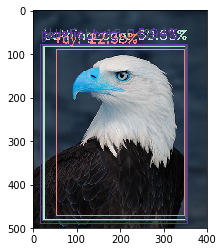

(<dnn_Net 0x11a6b9b50>,
 array([[[[0.00000000e+00, 1.40000000e+01, 3.56697477e-02,
           4.75017726e-02, 1.65522784e-01, 8.86537075e-01,
           9.74089622e-01],
          [0.00000000e+00, 1.80000000e+01, 3.05341423e-01,
           6.29364848e-02, 1.64441407e-01, 8.76794577e-01,
           9.63069141e-01],
          [0.00000000e+00, 2.60000000e+01, 2.35876888e-02,
           6.29364848e-02, 1.64441407e-01, 8.76794577e-01,
           9.63069141e-01],
          [0.00000000e+00, 5.00000000e+01, 1.19670695e-02,
           1.33802205e-01, 1.81444824e-01, 8.71640444e-01,
           9.42375839e-01],
          [0.00000000e+00, 5.50000000e+01, 4.43196408e-02,
           4.75017726e-02, 1.65522784e-01, 8.86537075e-01,
           9.74089622e-01],
          [0.00000000e+00, 5.80000000e+01, 1.08461203e-02,
           6.29364848e-02, 1.64441407e-01, 8.76794577e-01,
           9.63069141e-01],
          [0.00000000e+00, 8.80000000e+01, 1.47292819e-02,
           4.25574183e-02, 1.59342021e-01

In [158]:
obj_det_ilsvrc16(img2)

____ Image: ../Images/data_for_modeling/train/plastic/2.sei_2320463.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
_____ w: 748
_____ h: 420
_____ Detections:
[[[[0.00000000e+00 1.80000000e+01 3.96891683e-02 6.61267638e-02
    3.57154310e-02 9.73992646e-01 9.82577801e-01]
   [0.00000000e+00 1.80000000e+01 1.65023562e-02 4.90708649e-01
    7.40529895e-02 9.37605679e-01 9.35941994e-01]
   [0.00000000e+00 1.90000000e+01 1.02844359e-02 5.00838101e-01
    5.40232360e-02 9.26416099e-01 9.53645587e-01]
   [0.00000000e+00 9.60000000e+01 1.86761003e-02 5.00838101e-01
    5.40232360e-02 9.26416099e-01 9.53645587e-01]
   [0.00000000e+00 9.60000000e+01 1.03851035e-02 6.17083311e-02
    3.78611982e-02 9.75700974e-01 9.80884552e-01]
   [0.00000000e+00 1.24

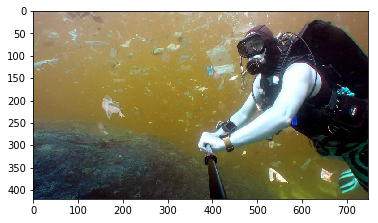

(<dnn_Net 0x21df5f4f0>,
 array([[[[0.00000000e+00, 1.80000000e+01, 3.96891683e-02,
           6.61267638e-02, 3.57154310e-02, 9.73992646e-01,
           9.82577801e-01],
          [0.00000000e+00, 1.80000000e+01, 1.65023562e-02,
           4.90708649e-01, 7.40529895e-02, 9.37605679e-01,
           9.35941994e-01],
          [0.00000000e+00, 1.90000000e+01, 1.02844359e-02,
           5.00838101e-01, 5.40232360e-02, 9.26416099e-01,
           9.53645587e-01],
          [0.00000000e+00, 9.60000000e+01, 1.86761003e-02,
           5.00838101e-01, 5.40232360e-02, 9.26416099e-01,
           9.53645587e-01],
          [0.00000000e+00, 9.60000000e+01, 1.03851035e-02,
           6.17083311e-02, 3.78611982e-02, 9.75700974e-01,
           9.80884552e-01],
          [0.00000000e+00, 1.24000000e+02, 9.40276757e-02,
           4.90708649e-01, 7.40529895e-02, 9.37605679e-01,
           9.35941994e-01],
          [0.00000000e+00, 1.24000000e+02, 4.64562029e-02,
           4.83482957e-01, 1.82436228e-01

In [154]:
obj_det_ilsvrc16(img3)

____ Image: ../Images/data_for_modeling/train/plastic/1_1.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
_____ w: 852
_____ h: 480
_____ Detections:
[[[[0.00000000e+00 9.00000000e+00 1.25238048e-02 3.00751925e-02
    3.53625417e-03 9.58145916e-01 9.90873218e-01]
   [0.00000000e+00 1.40000000e+01 1.43079944e-02 3.85022670e-01
    1.32452786e-01 5.85519254e-01 7.60450542e-01]
   [0.00000000e+00 1.80000000e+01 1.08112665e-02 2.36486197e-02
    3.32906544e-02 9.59082663e-01 9.78207827e-01]
   [0.00000000e+00 1.90000000e+01 1.32605089e-02 3.81479681e-01
    4.57114577e-02 6.83297694e-01 8.82888198e-01]
   [0.00000000e+00 1.90000000e+01 1.00701032e-02 6.07127845e-02
    1.12308562e-02 9.03693438e-01 1.00207114e+00]
   [0.00000000e+00 2.50000000e+01

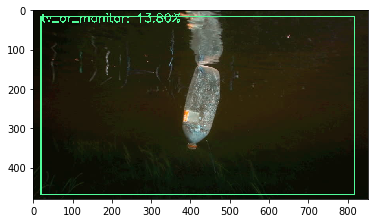

(<dnn_Net 0x12b5e34f0>,
 array([[[[0.00000000e+00, 9.00000000e+00, 1.25238048e-02,
           3.00751925e-02, 3.53625417e-03, 9.58145916e-01,
           9.90873218e-01],
          [0.00000000e+00, 1.40000000e+01, 1.43079944e-02,
           3.85022670e-01, 1.32452786e-01, 5.85519254e-01,
           7.60450542e-01],
          [0.00000000e+00, 1.80000000e+01, 1.08112665e-02,
           2.36486197e-02, 3.32906544e-02, 9.59082663e-01,
           9.78207827e-01],
          [0.00000000e+00, 1.90000000e+01, 1.32605089e-02,
           3.81479681e-01, 4.57114577e-02, 6.83297694e-01,
           8.82888198e-01],
          [0.00000000e+00, 1.90000000e+01, 1.00701032e-02,
           6.07127845e-02, 1.12308562e-02, 9.03693438e-01,
           1.00207114e+00],
          [0.00000000e+00, 2.50000000e+01, 1.24457404e-02,
           3.00751925e-02, 3.53625417e-03, 9.58145916e-01,
           9.90873218e-01],
          [0.00000000e+00, 1.24000000e+02, 1.20676896e-02,
           3.81479681e-01, 4.57114577e-02

In [159]:
obj_det_ilsvrc16(img4)

____ Image: ../Images/data_for_modeling/train/plastic/1.ocean-plastic-garbage-patch.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
_____ w: 653
_____ h: 435
_____ Detections:
[[[[ 0.00000000e+00  1.80000000e+01  5.10210134e-02  6.18839264e-02
     5.09962738e-02  8.84843349e-01  8.93262386e-01]
   [ 0.00000000e+00  1.80000000e+01  1.51699679e-02  3.64702195e-01
     1.42353147e-01  8.09800506e-01  7.62835741e-01]
   [ 0.00000000e+00  7.50000000e+01  2.25033499e-02  9.56219286e-02
     3.53165179e-01  2.26788834e-01  4.95972425e-01]
   [ 0.00000000e+00  9.00000000e+01  1.36660542e-02  2.16967732e-01
     1.07774615e-01  8.22400689e-01  8.23991716e-01]
   [ 0.00000000e+00  9.60000000e+01  6.19692840e-02  1.21990114e-01
     6.67507946e-02  8.61

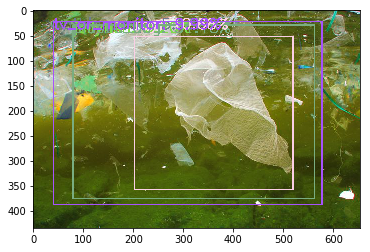

(<dnn_Net 0x11a629cb0>,
 array([[[[ 0.00000000e+00,  1.80000000e+01,  5.10210134e-02,
            6.18839264e-02,  5.09962738e-02,  8.84843349e-01,
            8.93262386e-01],
          [ 0.00000000e+00,  1.80000000e+01,  1.51699679e-02,
            3.64702195e-01,  1.42353147e-01,  8.09800506e-01,
            7.62835741e-01],
          [ 0.00000000e+00,  7.50000000e+01,  2.25033499e-02,
            9.56219286e-02,  3.53165179e-01,  2.26788834e-01,
            4.95972425e-01],
          [ 0.00000000e+00,  9.00000000e+01,  1.36660542e-02,
            2.16967732e-01,  1.07774615e-01,  8.22400689e-01,
            8.23991716e-01],
          [ 0.00000000e+00,  9.60000000e+01,  6.19692840e-02,
            1.21990114e-01,  6.67507946e-02,  8.61741304e-01,
            8.66168499e-01],
          [ 0.00000000e+00,  9.60000000e+01,  2.56089419e-02,
            3.61414909e-01,  2.17511088e-01,  8.16504598e-01,
            7.88283944e-01],
          [ 0.00000000e+00,  9.60000000e+01,  1.59343444e-

In [160]:
obj_det_ilsvrc16(img5)

[INFO] loading model...
[INFO] classification took 0.047664 seconds
[INFO] 1. label: plastic bag, probability: 0.60415
[INFO] 2. label: stingray, probability: 0.23569
[INFO] 3. label: shower cap, probability: 0.020077
[INFO] 4. label: spider web, probability: 0.020014
[INFO] 5. label: diaper, probability: 0.012154


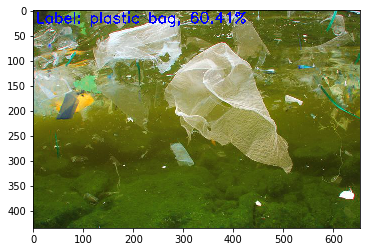

<dnn_Net 0x12a6e4df0>

In [162]:
dl_cv(img5)

____ Image: ../deep-learning-opencv/images/eagle.png
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
_____ w: 400
_____ h: 500
_____ Detections:
[[[[0.         3.         0.99980134 0.02938682 0.1983597  0.86061245
    0.98448694]]]]
1
detections shape:  (1, 1, 1, 7)
detections shape[2]:  1
i is:  0
confidence: 0.99980134
[INFO] bird: 99.98%


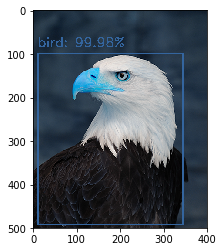

(<dnn_Net 0x12a6dd190>,
 array([[[[0.        , 3.        , 0.99980134, 0.02938682, 0.1983597 ,
           0.86061245, 0.98448694]]]], dtype=float32),
 400,
 500)

In [129]:
obj_det(1, img2)

____ Image: ../Images/data_for_modeling/train/plastic/2.sei_2320463.jpg
____ Classes list: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
[INFO] loading model...
[INFO] computing object detections...
_____ w: 748
_____ h: 420
_____ Detections:
[[[[ 0.         15.          0.98478436  0.50004244  0.04606035
     0.99757934  0.9921955 ]]]]
1
detections shape:  (1, 1, 1, 7)
detections shape[2]:  1
i is:  0
confidence: 0.98478436
[INFO] person: 98.48%


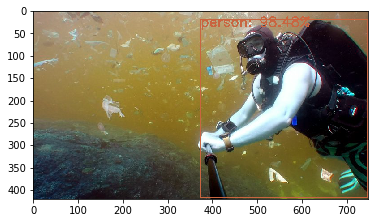

(<dnn_Net 0x127db9050>,
 array([[[[ 0.        , 15.        ,  0.98478436,  0.50004244,
            0.04606035,  0.99757934,  0.9921955 ]]]], dtype=float32),
 748,
 420)

In [134]:
obj_det(1, img3)